# Sprint 10: Integrated Project 2 #

# Preliminaries #

In [1]:
# Load libraries

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from scipy import stats as st

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import make_scorer

In [2]:
# Load data

df_train = pd.read_csv('/datasets/gold_recovery_train.csv', parse_dates=['date'])
df_test = pd.read_csv('/datasets/gold_recovery_test.csv', parse_dates=['date'])
df_full = pd.read_csv('/datasets/gold_recovery_full.csv', parse_dates=['date'])

The goal of this project is to simulate the process of recovering gold from ore and train a model predicting the outputs of that process. I will examine the data for mislabeled or missing data, outliers, and other distributional problems. Then I will explore relevant variables to ensure their suitability for modeling and write a function to calculate recovery values. Finally, I will train several regression models, selecting the best performing ones and evaluating them with symmetric mean absolute percentage error (sMAPE). 

# Examine and Prepare the Data #

In [3]:
# Examine the df_train, df_test, and df_full dataframes

display(df_train.info())
display(df_train)
print()
display(df_test.info())
display(df_test)
print()
display(df_full.info())
display(df_full)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   date                                                16860 non-null  datetime64[ns]
 1   final.output.concentrate_ag                         16788 non-null  float64       
 2   final.output.concentrate_pb                         16788 non-null  float64       
 3   final.output.concentrate_sol                        16490 non-null  float64       
 4   final.output.concentrate_au                         16789 non-null  float64       
 5   final.output.recovery                               15339 non-null  float64       
 6   final.output.tail_ag                                16794 non-null  float64       
 7   final.output.tail_pb                                16677 non-null  float64       
 8   final.

None

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16855,2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,...,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
16856,2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,...,22.960095,-501.612783,20.035660,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608
16857,2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,...,23.015718,-501.711599,19.951231,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452
16858,2018-08-18 09:59:59,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,...,23.024963,-501.153409,20.054122,-500.314711,17.979515,-499.272871,12.992404,-499.976268,20.013986,-500.625471



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5856 entries, 0 to 5855
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   date                                        5856 non-null   datetime64[ns]
 1   primary_cleaner.input.sulfate               5554 non-null   float64       
 2   primary_cleaner.input.depressant            5572 non-null   float64       
 3   primary_cleaner.input.feed_size             5856 non-null   float64       
 4   primary_cleaner.input.xanthate              5690 non-null   float64       
 5   primary_cleaner.state.floatbank8_a_air      5840 non-null   float64       
 6   primary_cleaner.state.floatbank8_a_level    5840 non-null   float64       
 7   primary_cleaner.state.floatbank8_b_air      5840 non-null   float64       
 8   primary_cleaner.state.floatbank8_b_level    5840 non-null   float64       
 9   primary

None

,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,...,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
1,2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,...,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2,2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,...,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
3,2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,...,12.033091,-498.350935,8.074946,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987
4,2016-09-01 04:59:59,199.099327,10.682530,7.530000,0.805575,1401.268123,-500.808305,1398.128818,-499.504543,1402.172226,...,12.025367,-500.786497,8.054678,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5851,2017-12-31 19:59:59,173.957757,15.963399,8.070000,0.896701,1401.930554,-499.728848,1401.441445,-499.193423,1399.810313,...,13.995957,-500.157454,12.069155,-499.673279,7.977259,-499.516126,5.933319,-499.965973,8.987171,-499.755909
5852,2017-12-31 20:59:59,172.910270,16.002605,8.070000,0.896519,1447.075722,-494.716823,1448.851892,-465.963026,1443.890424,...,16.749781,-496.031539,13.365371,-499.122723,9.288553,-496.892967,7.372897,-499.942956,8.986832,-499.903761
5853,2017-12-31 21:59:59,171.135718,15.993669,8.070000,1.165996,1498.836182,-501.770403,1499.572353,-495.516347,1502.749213,...,19.994130,-499.791312,15.101425,-499.936252,10.989181,-498.347898,9.020944,-500.040448,8.982038,-497.789882
5854,2017-12-31 22:59:59,179.697158,15.438979,8.070000,1.501068,1498.466243,-500.483984,1497.986986,-519.200340,1496.569047,...,19.958760,-499.958750,15.026853,-499.723143,11.011607,-499.985046,9.009783,-499.937902,9.012660,-500.154284



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22716 entries, 0 to 22715
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   date                                                22716 non-null  datetime64[ns]
 1   final.output.concentrate_ag                         22627 non-null  float64       
 2   final.output.concentrate_pb                         22629 non-null  float64       
 3   final.output.concentrate_sol                        22331 non-null  float64       
 4   final.output.concentrate_au                         22630 non-null  float64       
 5   final.output.recovery                               20753 non-null  float64       
 6   final.output.tail_ag                                22633 non-null  float64       
 7   final.output.tail_pb                                22516 non-null  float64       
 8   final

None

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22711,2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,...,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
22712,2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,...,22.960095,-501.612783,20.035660,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608
22713,2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,...,23.015718,-501.711599,19.951231,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452
22714,2018-08-18 09:59:59,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,...,23.024963,-501.153409,20.054122,-500.314711,17.979515,-499.272871,12.992404,-499.976268,20.013986,-500.625471


In [4]:
# Create functions to examine columns

def histo(df, column):
    if (len(df[column].unique()) < 100): bins = len(df[column].unique())
    else: bins = 100

    plt.hist(df[column], bins=bins)
    plt.xlabel(column)
    plt.ylabel('Number of Observations')
    plt.title(f'Histogram for {column}')
    plt.show()

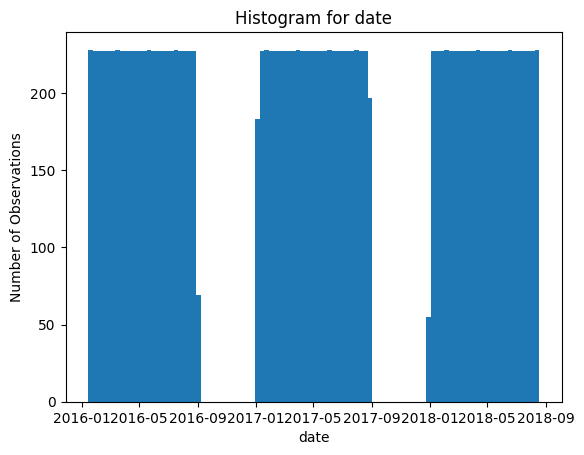

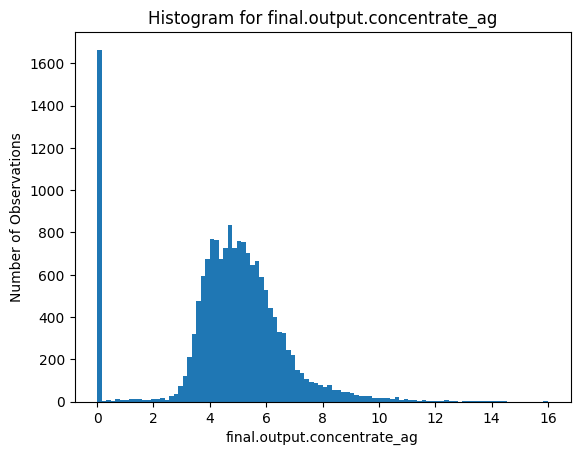

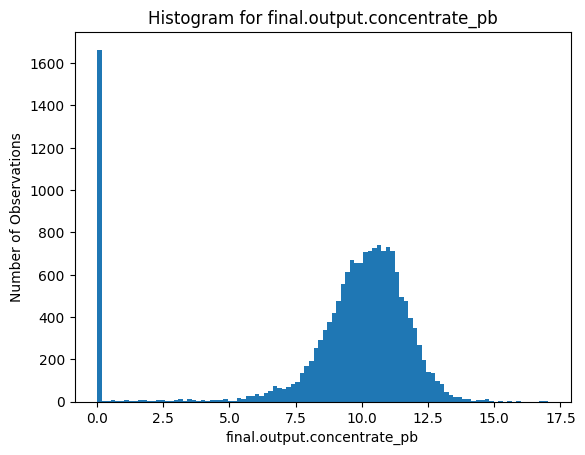

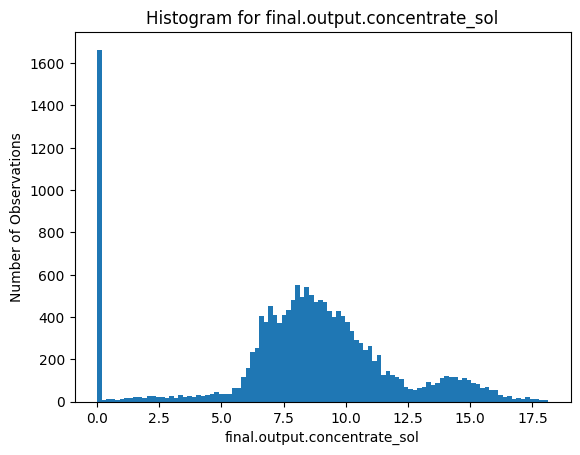

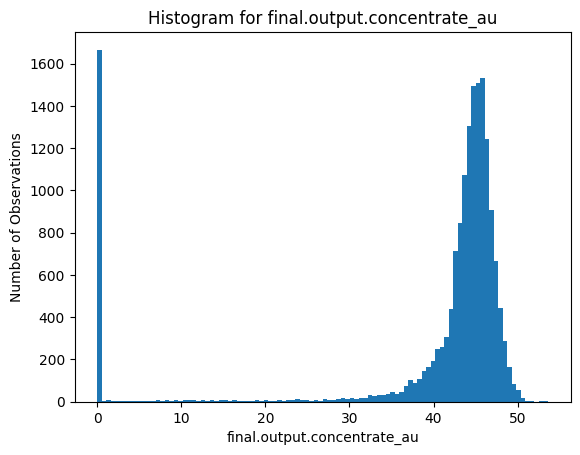

...

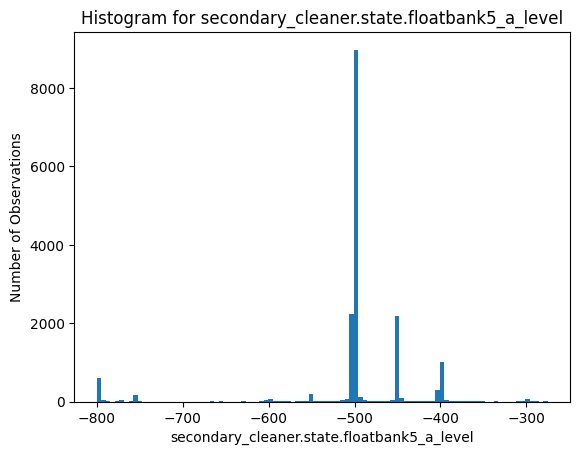

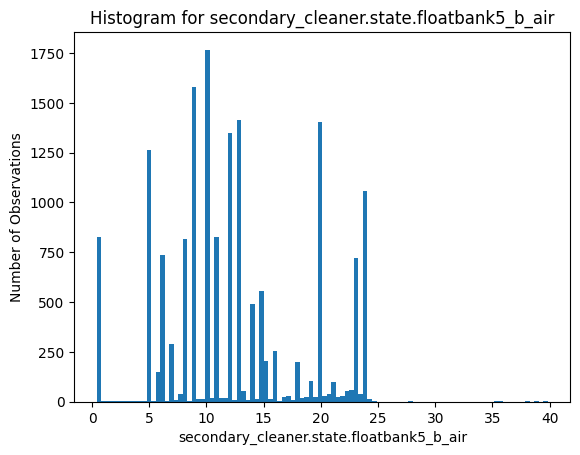

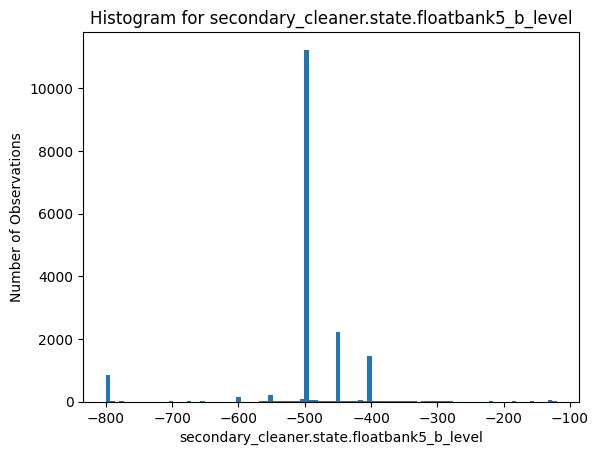

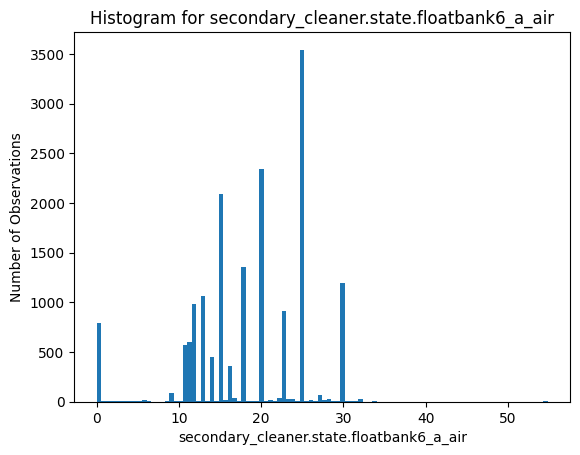

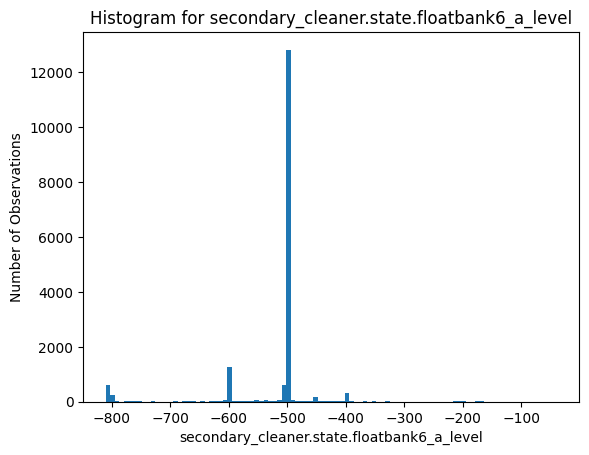

In [5]:
# Examine the distributions of columns in the df_train dataframe

for col in df_train.columns:
    histo(df_train, col)

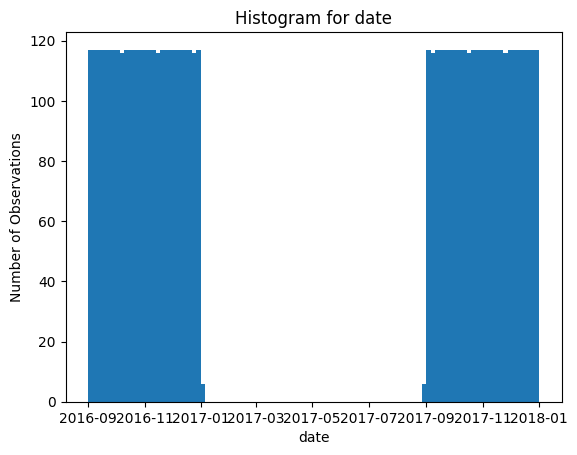

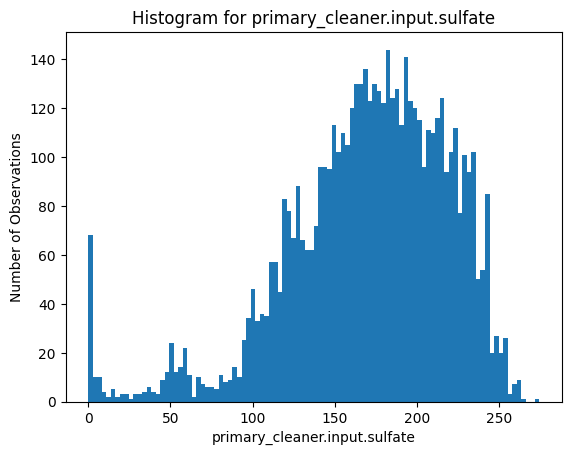

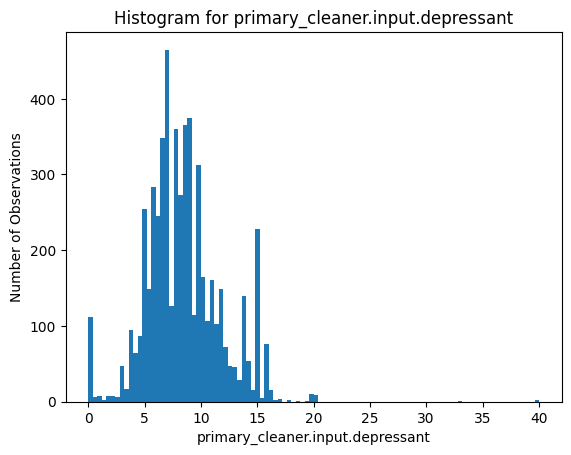

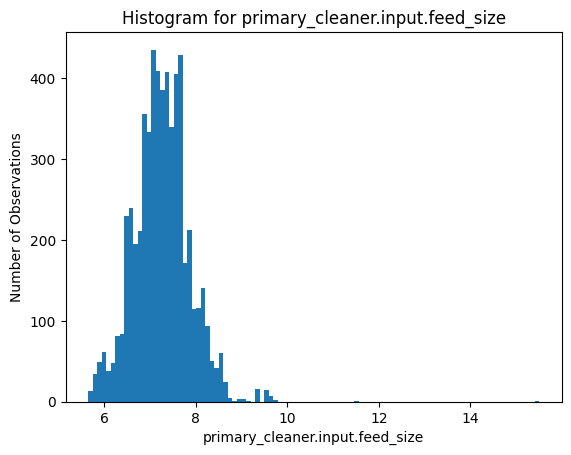

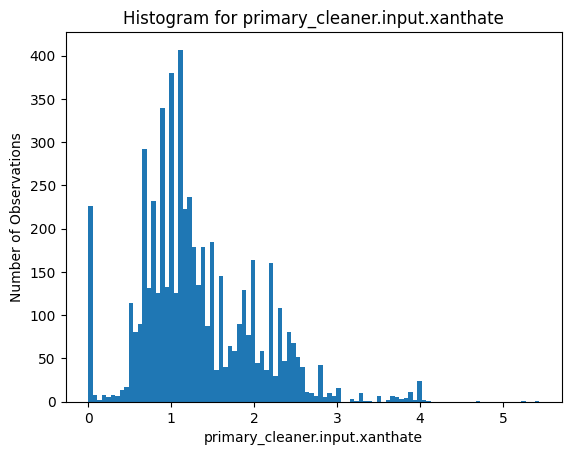

...

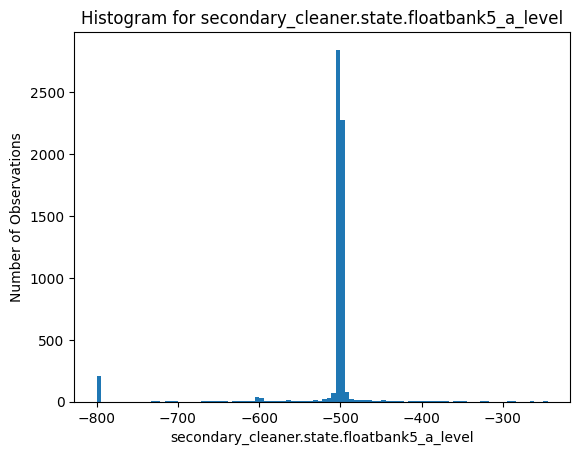

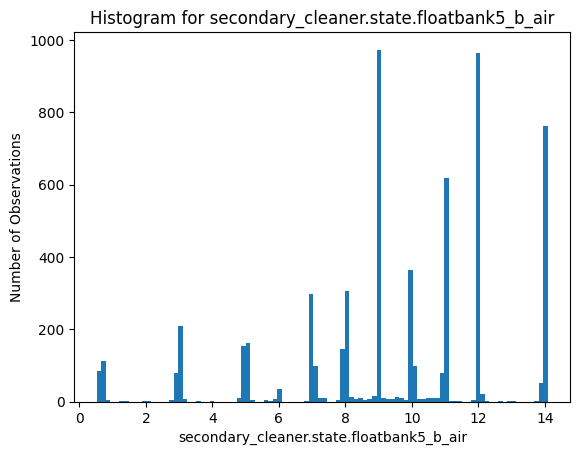

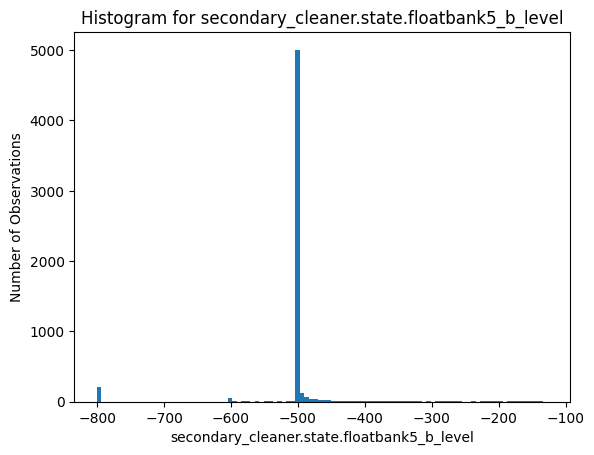

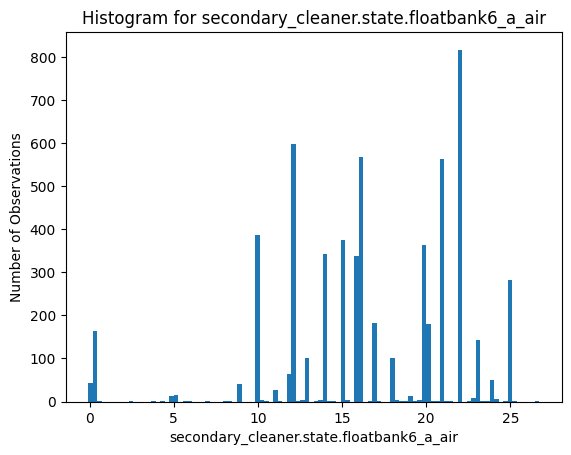

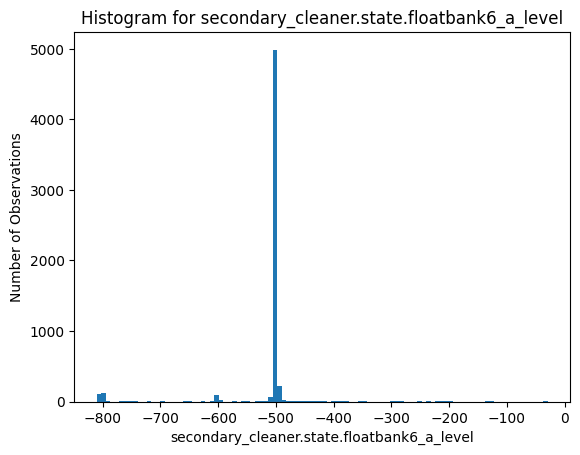

In [6]:
# Examine the distributions of columns in the df_test dataframe

for col in df_test.columns:
    histo(df_test, col)

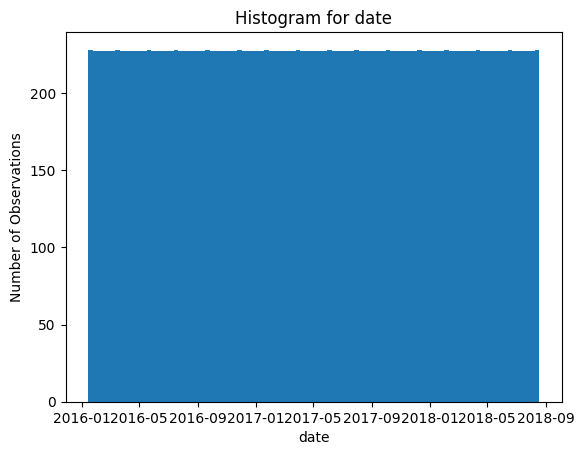

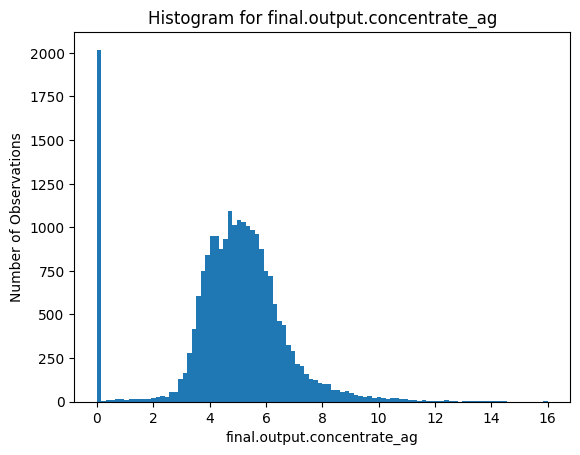

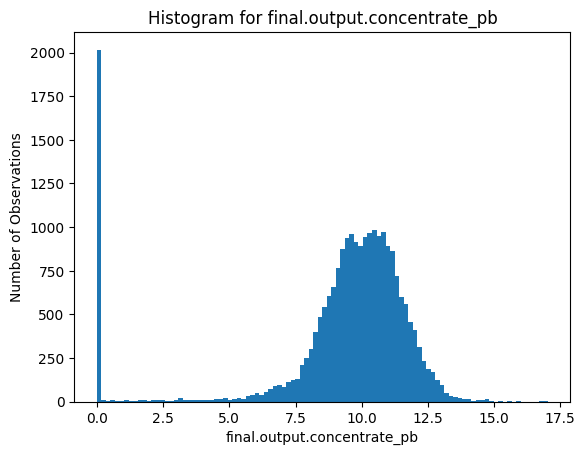

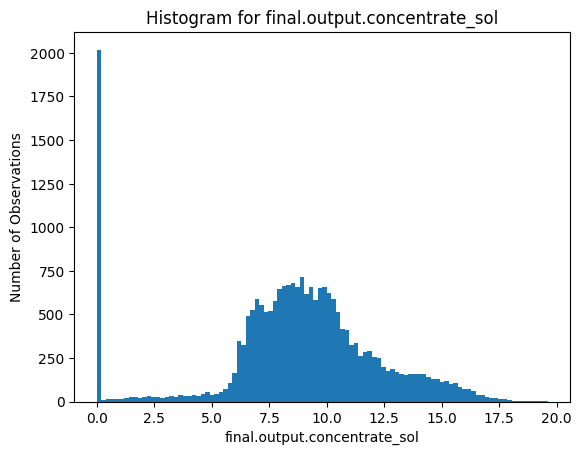

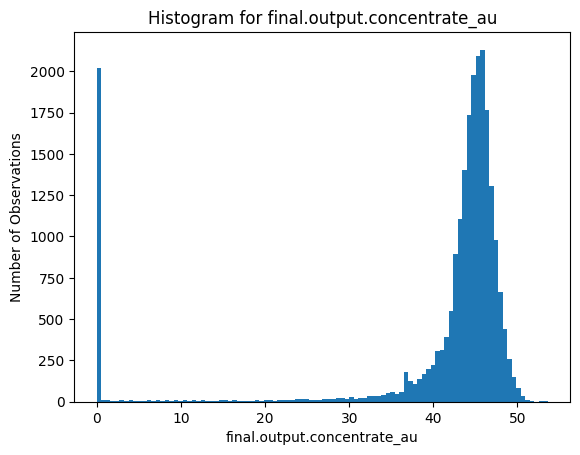

...

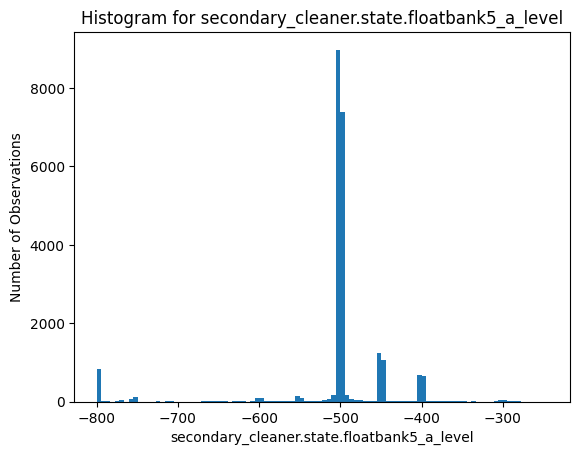

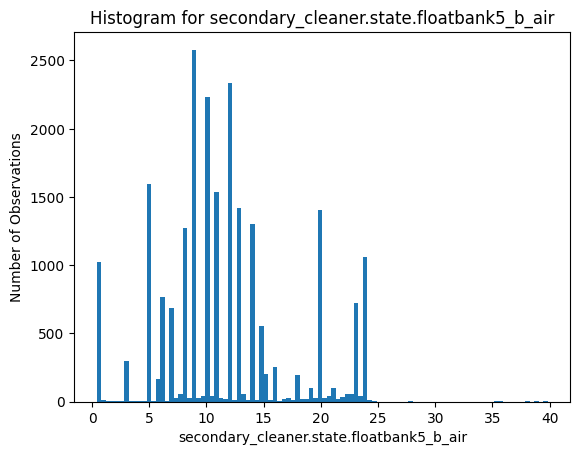

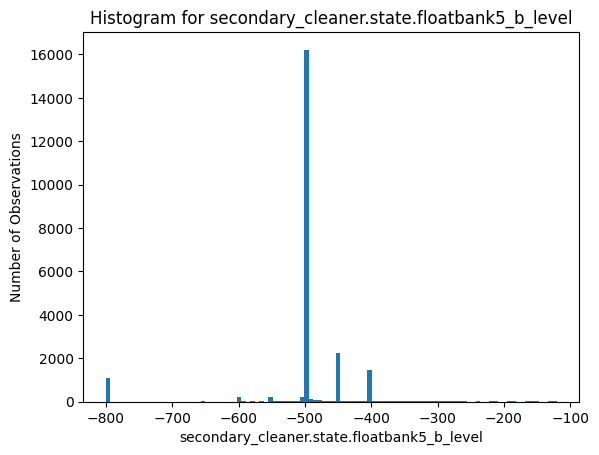

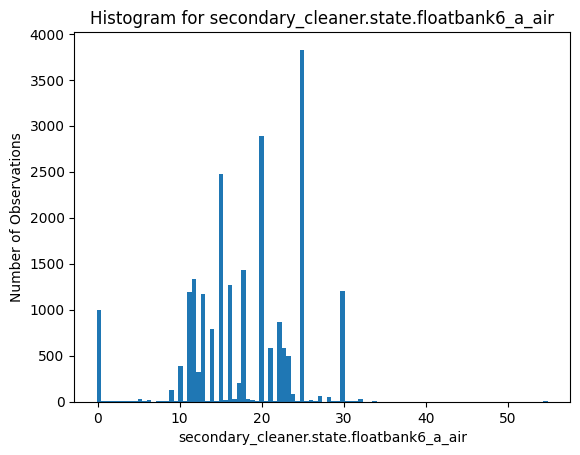

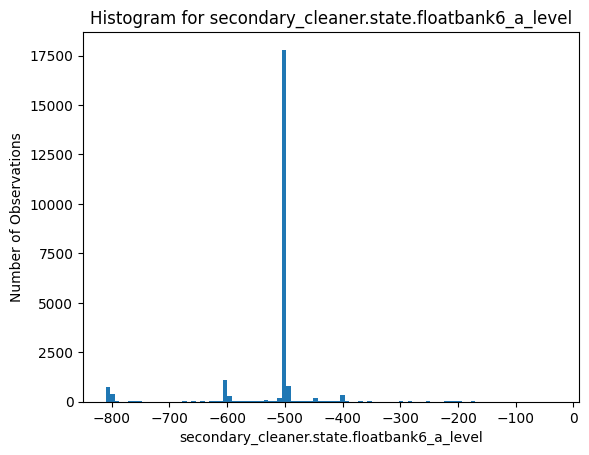

In [7]:
# Examine the distributions of columns in the df_full dataframe

for col in df_full.columns:
    histo(df_full, col)

The data look good overall. I imported the date columns as datetime64 and the rest are all appropriately float64, so no data types need to be changed in any of the three dataframes. 

The extremely large number of columns (87 for df_train and df_full and 53 for df_test) makes extensive data exploration unwieldy. A cursory examination reveals a great variety of distributions. Some columns are approximately normal while others are skewed, restricted in range, or plagued by outliers. The primary cleaner input columns tend to be the most normal and the state and calculation columns tend to be the least normal. Many output and rougher input columns have very high frequencies of zeros. Those excess zeros might represent something special such as equipment failure or lost data, but without more information, I will take them at face value. These are only generalizations because it is impossible to summarize so much data simply and comprehensively. 

In [8]:
# Create a function to calculate rougher recovery values

def recovery_rougher(df):
    c = df['rougher.output.concentrate_au']
    f = df['rougher.input.feed_au']
    t = df['rougher.output.tail_au']
    return 100 * (c*(f-t))/(f*(c-t))

In [9]:
# Calculate rougher recovery values for the df_train dataframe

df_train['recovery_rougher'] = recovery_rougher(df_train)

with pd.option_context('display.float_format', '{:.2f}'.format):
    display(df_train['recovery_rougher'].describe())

count   14577.00
mean         NaN
std          NaN
min         -inf
25%        79.65
50%        85.22
75%        90.20
max          inf
Name: recovery_rougher, dtype: float64

In [10]:
# Explore divide-by-zero issues with calculated recovery values in the df_train dataframe

bad_values = df_train['recovery_rougher'].isin([float('inf'), float('-inf'), float('nan')]).sum()

print('Problematic values (inf, -inf, and nan) in the recovery_rougher column:', bad_values) 

Problematic values (inf, -inf, and nan) in the recovery_rougher column: 2313


The formula for calculating rougher recovery can lead to problems because it tries to divide by zero if F (rougher.input.feed_au) = 0 or C (rougher.output.concentrate_au) = T (rougher.output.tail_au). That occurs in 2,313 rows, 13.7% of the training dataset.

Unlike the earlier missing values, these cannot be presumed to be missing at random. They indicate a particular configuration of observations that are incompatible with the recovery formula. Those observations might be outside the intended domain of the formula or some of those zeros might be mistakes or missing values. Either way, there is no basis for filling these aberrations with an arbitrary value, be it zero, the mean, or the median without more domain knowledge or consulting an expert. Since the recovery estimates are the relevant output in this exercise, nothing would be gained from imputing them. It would add no useful information and contribute only noise. I will trust the formula and drop rows with inf, -inf, or nan values for the purposes of verifying the recovery calculations. 

In [11]:
# Create a new dataframe without the inf, -inf, or nan calculated rougher recovery values in the df_train dataframe

df_train_calc = df_train[df_train['recovery_rougher'].replace([float('inf'), float('-inf')], np.nan).notna()].copy()

df_train_calc['recovery_rougher'].isin([float('inf'), float('-inf'), np.nan]).sum()

0

In [12]:
# Drop rows with missing values in the rougher.output.recovery column in the df_train_calc dataframe

df_train_calc = df_train_calc.dropna(subset=['rougher.output.recovery'])

df_train_calc['rougher.output.recovery'].isna().sum()

0

In [13]:
# Calculate MAE between calculated rougher recovery and the rougher.output.recovery column in the df_train_calc dataframe

mean_absolute_error(df_train_calc['rougher.output.recovery'], df_train_calc['recovery_rougher'])

1.0724115653039479e-14

count    14287.000000
mean        82.394201
std         15.096808
min         -0.000000
25%         79.818372
50%         85.235997
75%         90.131691
max        100.000000
Name: recovery_rougher, dtype: float64

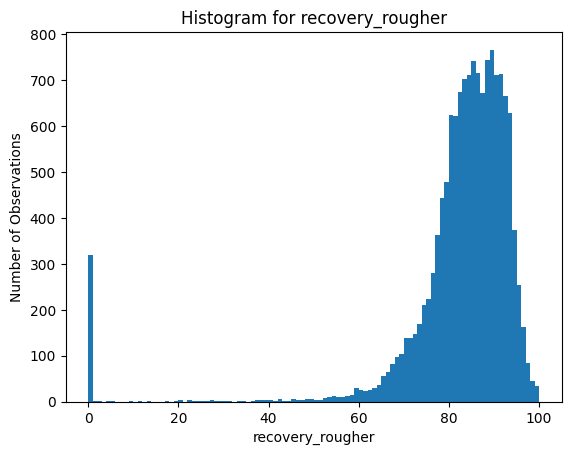

count    14287.000000
mean        82.394201
std         15.096808
min          0.000000
25%         79.818372
50%         85.235997
75%         90.131691
max        100.000000
Name: rougher.output.recovery, dtype: float64

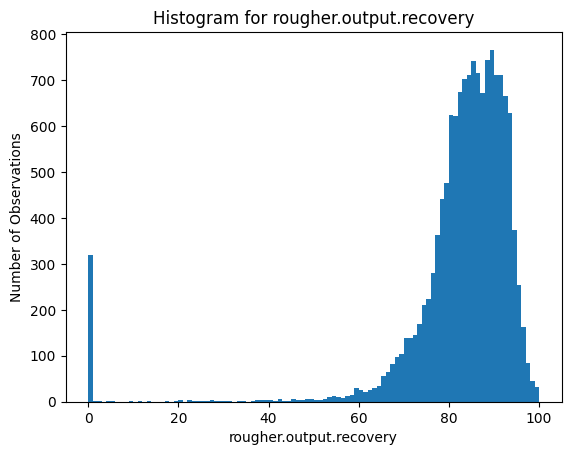

In [14]:
# Check the distributions for calculated rougher recovery and the rougher.output.recovery column in the df_train_calc dataframe

display(df_train_calc['recovery_rougher'].describe())
histo(df_train_calc, 'recovery_rougher')
print()
display(df_train_calc['rougher.output.recovery'].describe())
histo(df_train_calc, 'rougher.output.recovery')

The mean absolute error between calculated rougher recovery and the rougher.output.recovery column in the df_train_calc dataframe is effectively zero and the distributions for those columns are identical. The formula works as expected. 

In [15]:
# Examine missing values for columns in all relevant dataframes

with pd.option_context('display.max_rows', None): 
    print(f"Missing values for df_train dataframe columns (for {len(df_train)} rows):")
    display(df_train.isna().sum().sort_values(ascending=False))
    print()
    print(f"Missing values for df_test dataframe columns (for {len(df_test)} rows):")
    display(df_test.isna().sum().sort_values(ascending=False))
    print()
    print(f"Missing values for df_full dataframe columns (for {len(df_full)} rows):")
    display(df_full.isna().sum().sort_values(ascending=False))

Missing values for df_train dataframe columns (for 16860 rows):


rougher.output.recovery                               2573
recovery_rougher                                      2283
rougher.output.tail_ag                                2250
rougher.output.tail_au                                2249
rougher.output.tail_sol                               2249
secondary_cleaner.output.tail_sol                     1986
rougher.input.floatbank11_xanthate                    1904
final.output.recovery                                 1521
primary_cleaner.input.sulfate                         1307
primary_cleaner.input.depressant                      1262
rougher.calculation.au_pb_ratio                       1242
rougher.input.floatbank10_sulfate                     1044
primary_cleaner.input.xanthate                         985
primary_cleaner.output.concentrate_sol                 636
rougher.input.floatbank11_sulfate                      623
rougher.state.floatbank10_e_air                        603
rougher.input.feed_rate                                5


Missing values for df_test dataframe columns (for 5856 rows):


rougher.input.floatbank11_xanthate            353
primary_cleaner.input.sulfate                 302
primary_cleaner.input.depressant              284
rougher.input.floatbank10_sulfate             257
primary_cleaner.input.xanthate                166
rougher.input.floatbank10_xanthate            123
rougher.input.feed_sol                         67
rougher.input.floatbank11_sulfate              55
rougher.input.feed_rate                        40
secondary_cleaner.state.floatbank3_a_air       34
secondary_cleaner.state.floatbank2_b_air       23
rougher.input.feed_size                        22
secondary_cleaner.state.floatbank2_a_air       20
rougher.state.floatbank10_a_air                17
rougher.state.floatbank10_c_air                17
rougher.state.floatbank10_d_air                17
rougher.state.floatbank10_e_air                17
rougher.state.floatbank10_b_air                17
rougher.state.floatbank10_f_air                17
secondary_cleaner.state.floatbank3_a_level     16



Missing values for df_full dataframe columns (for 22716 rows):


rougher.output.recovery                               3119
rougher.output.tail_ag                                2737
rougher.output.tail_au                                2736
rougher.output.tail_sol                               2736
rougher.input.floatbank11_xanthate                    2257
secondary_cleaner.output.tail_sol                     2215
final.output.recovery                                 1963
rougher.calculation.au_pb_ratio                       1627
primary_cleaner.input.sulfate                         1609
primary_cleaner.input.depressant                      1546
rougher.input.floatbank10_sulfate                     1301
primary_cleaner.input.xanthate                        1151
primary_cleaner.output.concentrate_sol                 798
rougher.input.floatbank11_sulfate                      678
rougher.state.floatbank10_e_air                        620
rougher.input.feed_rate                                553
rougher.input.floatbank10_xanthate                     4

In [16]:
# Examine the number of missing values per row in all relevant dataframes

def count_missing(df, name):
    absolute_counts = df.isnull().sum(axis=1).value_counts().sort_index()
    normalized_counts = df.isnull().sum(axis=1).value_counts(normalize=True).sort_index()
    
    print(f"Number of missing values per row in any column from the {name} dataframe (for {len(df)} rows):")
    display(pd.DataFrame({'Absolute Count': absolute_counts, 'Normalized Count': normalized_counts}))

count_missing(df_train, 'df_train')
count_missing(df_test, 'df_test')
count_missing(df_full, 'df_full')

Number of missing values per row in any column from the df_train dataframe (for 16860 rows):


,Absolute Count,Normalized Count
0,11017,0.653440
1,2694,0.159786
2,507,0.030071
3,185,0.010973
4,96,0.005694
5,370,0.021945
6,163,0.009668
7,121,0.007177
8,79,0.004686
9,167,0.009905


Number of missing values per row in any column from the df_test dataframe (for 5856 rows):


,Absolute Count,Normalized Count
0,5383,0.919228
1,100,0.017077
2,69,0.011783
3,59,0.010075
4,78,0.013320
5,100,0.017077
6,45,0.007684
7,5,0.000854
12,1,0.000171
51,16,0.002732


Number of missing values per row in any column from the df_full dataframe (for 22716 rows):


,Absolute Count,Normalized Count
0,16094,0.708487
1,2836,0.124846
2,577,0.025401
3,241,0.010609
4,477,0.020998
5,200,0.008804
6,174,0.007660
7,110,0.004842
8,215,0.009465
9,356,0.015672


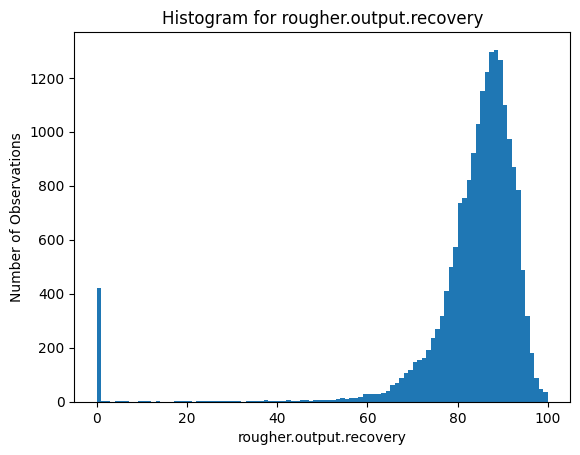

mean = 83.08, median = 86.14


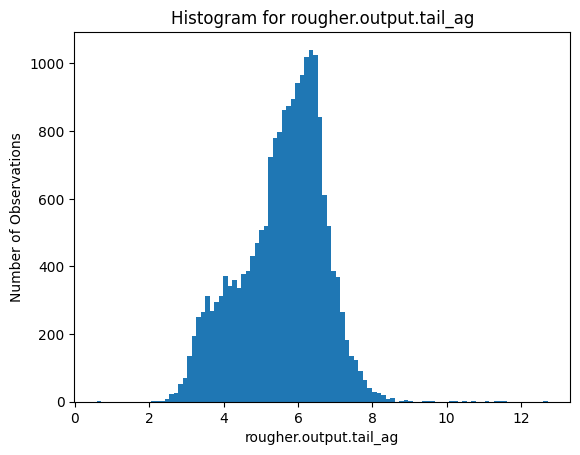

mean = 5.59, median = 5.76


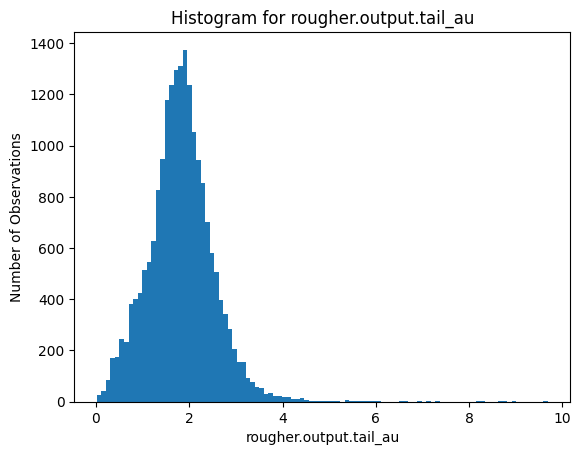

mean = 1.82, median = 1.81


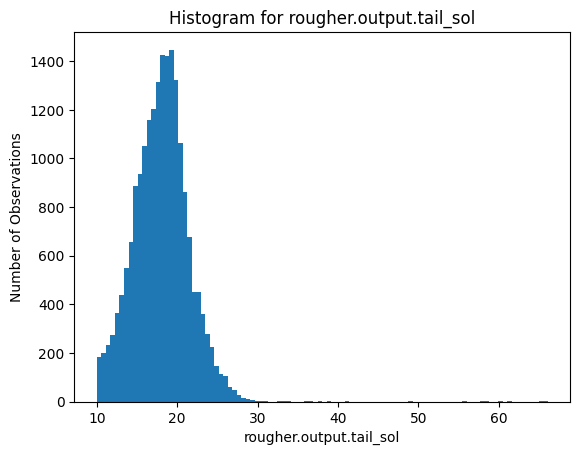

mean = 18.04, median = 18.08


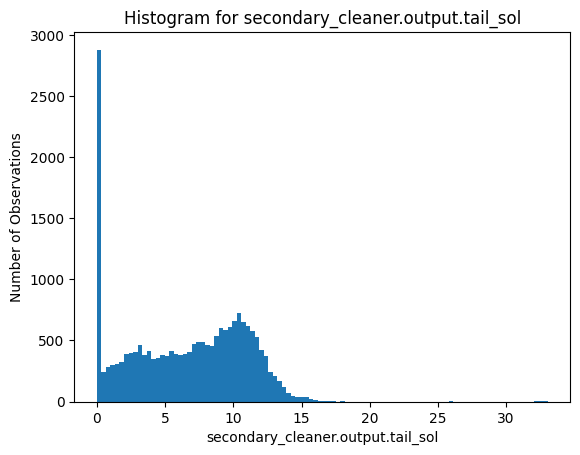

mean = 6.47, median = 6.97


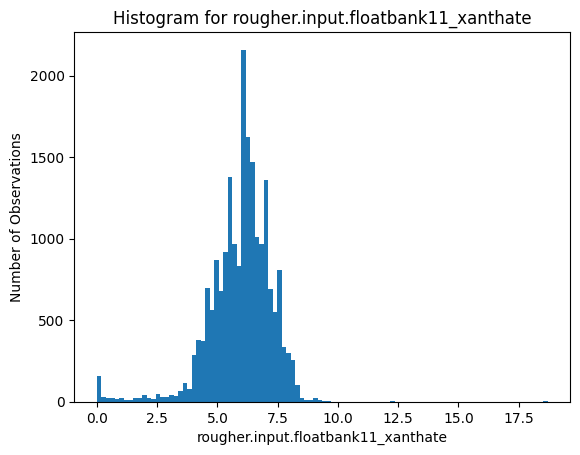

mean = 5.96, median = 6.03


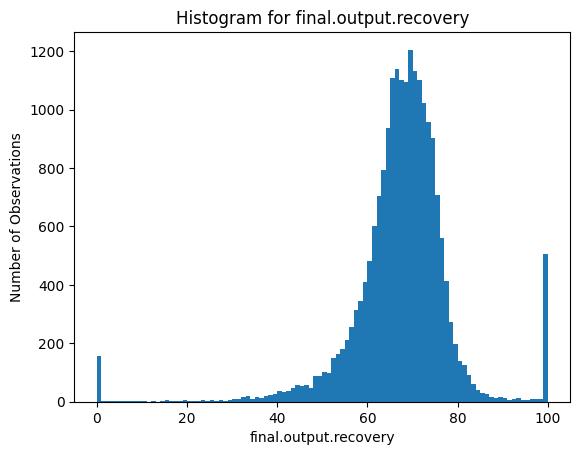

mean = 67.45, median = 68.32


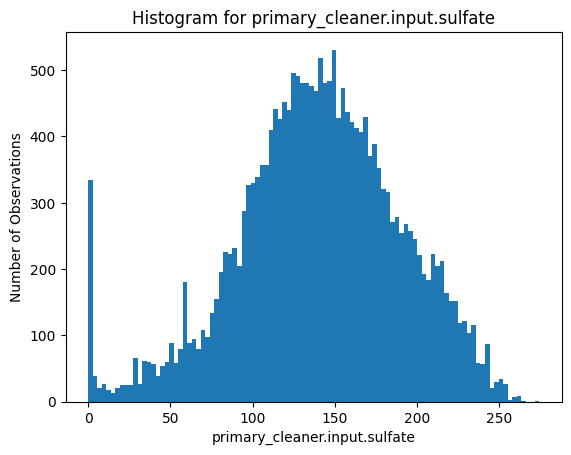

mean = 140.28, median = 141.33


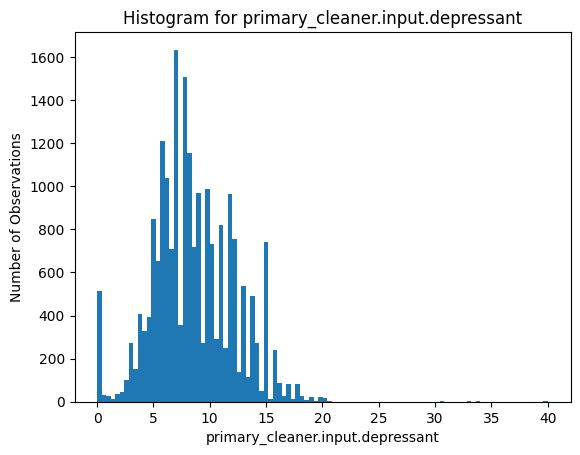

mean = 8.59, median = 8.02


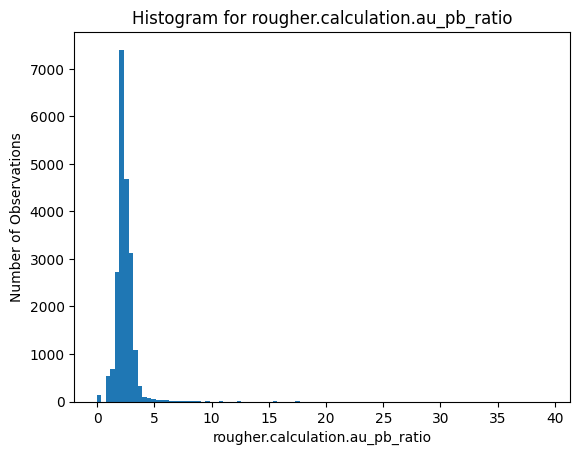

mean = 2.39, median = 2.29


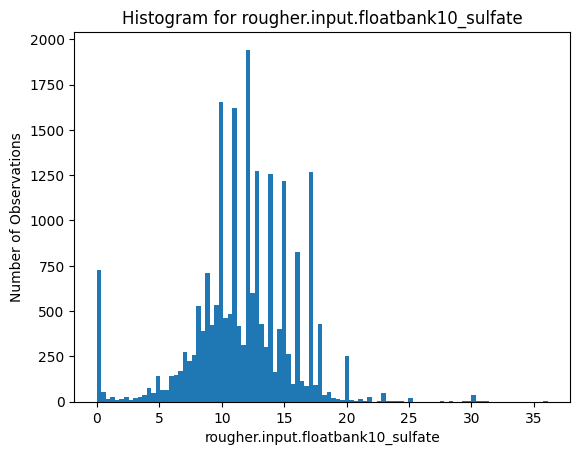

mean = 11.78, median = 12.00


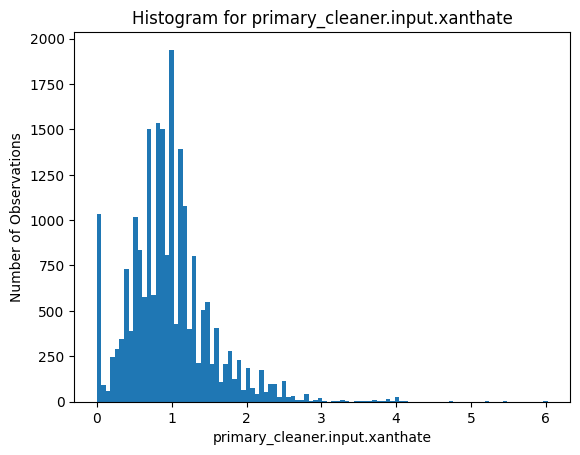

mean = 0.97, median = 0.91


In [17]:
# Examine the distributions of columns missing more than about 5% of rows in the df_full dataframe

top_missing_cols = ['rougher.output.recovery', 'rougher.output.tail_ag', 'rougher.output.tail_au', 'rougher.output.tail_sol', 'secondary_cleaner.output.tail_sol', 'rougher.input.floatbank11_xanthate', 'final.output.recovery', 'primary_cleaner.input.sulfate', 'primary_cleaner.input.depressant', 'rougher.calculation.au_pb_ratio', 'rougher.input.floatbank10_sulfate', 'primary_cleaner.input.xanthate']

for col in top_missing_cols:
    histo(df_full, col)
    print(f"mean = {df_full[col].mean():.2f}, median = {df_full[col].median():.2f}")

A large number of data are missing. Every column is missing at least some values with two exceptions: date and primary_cleaner.input.feed_size. Most rows (65% for df_train, 92% for df_test, and 71% for df_full) are missing no values but a handful from each dataframe are missing data from most columns. Given the widespread, sparse, and apparently random (as far as I can tell) nature of the missing data, I think imputing values is preferable to dropping too many rows. Twelve original columns (all input or output) are missing more than about 5% of data in df_train and df_full. Their distributions are relatively normal, so they are amenable to imputation. Because values near each other in time tend to be similar and the data are ordered by date and time, it makes the most sense to use a forward filling method that propagates the last valid observation forward. I will fill missing values in that manner for all columns. 

In [18]:
# Fill missing values with the forward filling method in all dataframes

df_train.fillna(method='ffill', inplace=True)
df_test.fillna(method='ffill', inplace=True)
df_full.fillna(method='ffill', inplace=True)

df_train.isna().sum().sum()

0

In [19]:
# Examine the columns from the df_train dataset not available in the df_test dataframe

print('columns in df_test:')
display(list(df_test.columns))
print()
print('columns missing from df_test')
display([col for col in df_train.columns if col not in df_test.columns])

columns in df_test:


['date',
 'primary_cleaner.input.sulfate',
 'primary_cleaner.input.depressant',
 'primary_cleaner.input.feed_size',
 'primary_cleaner.input.xanthate',
 'primary_cleaner.state.floatbank8_a_air',
 'primary_cleaner.state.floatbank8_a_level',
 'primary_cleaner.state.floatbank8_b_air',
 'primary_cleaner.state.floatbank8_b_level',
 'primary_cleaner.state.floatbank8_c_air',
 'primary_cleaner.state.floatbank8_c_level',
 'primary_cleaner.state.floatbank8_d_air',
 'primary_cleaner.state.floatbank8_d_level',
 'rougher.input.feed_ag',
 'rougher.input.feed_pb',
 'rougher.input.feed_rate',
 'rougher.input.feed_size',
 'rougher.input.feed_sol',
 'rougher.input.feed_au',
 'rougher.input.floatbank10_sulfate',
 'rougher.input.floatbank10_xanthate',
 'rougher.input.floatbank11_sulfate',
 'rougher.input.floatbank11_xanthate',
 'rougher.state.floatbank10_a_air',
 'rougher.state.floatbank10_a_level',
 'rougher.state.floatbank10_b_air',
 'rougher.state.floatbank10_b_level',
 'rougher.state.floatbank10_c_air'


columns missing from df_test


['final.output.concentrate_ag',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.concentrate_au',
 'final.output.recovery',
 'final.output.tail_ag',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'final.output.tail_au',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'primary_cleaner.output.tail_au',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.au_pb_ratio',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.concentrate_au',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_pb',
 'rougher.output.ta

The df_test dataframe includes only the 53 input and state columns, excluding all 34 output and calculation columns available in the other dataframes.

# Analyze the Data #

In [20]:
# Examine the concentrations of metals (Au, Ag, Pb) at different purification stages in the df_train dataframe

stage_metals = {
    1: ['rougher.input.feed_ag', 'rougher.input.feed_pb', 'rougher.input.feed_au'],
    2: ['rougher.output.tail_ag', 'rougher.output.tail_pb', 'rougher.output.tail_au'],
    3: ['rougher.output.concentrate_ag', 'rougher.output.concentrate_pb', 'rougher.output.concentrate_au'],
    4: ['primary_cleaner.output.tail_ag', 'primary_cleaner.output.tail_pb', 'primary_cleaner.output.tail_au'],
    5: ['primary_cleaner.output.concentrate_ag', 'primary_cleaner.output.concentrate_pb', 'primary_cleaner.output.concentrate_au'],
    6: ['secondary_cleaner.output.tail_ag', 'secondary_cleaner.output.tail_pb', 'secondary_cleaner.output.tail_au'],
    7: ['final.output.tail_ag', 'final.output.tail_pb', 'final.output.tail_au'],
    8: ['final.output.concentrate_ag', 'final.output.concentrate_pb', 'final.output.concentrate_au']
}

stages = ['rougher feed', 'rougher tail', 'rougher concentrate', 'primary cleaner tail', 'primary cleaner concentrate', 'secondary cleaner tail', 'final tail', 'final concentrate']
silver = []
lead = []
gold = []
for stage in range(1,9):
    silver.append(df_train[stage_metals[stage][0]].mean())
    lead.append(df_train[stage_metals[stage][1]].mean())
    gold.append(df_train[stage_metals[stage][2]].mean())
        
concentrations = pd.DataFrame({'stage': stages, 'silver': silver, 'lead': lead, 'gold': gold}).round(2)
concentrations.index = range(1, 9)
display(concentrations)                     

,stage,silver,lead,gold
1,rougher feed,7.80,3.19,7.14
2,rougher tail,5.56,0.59,1.81
3,rougher concentrate,10.54,6.86,17.34
4,primary cleaner tail,14.87,3.15,3.58
5,primary cleaner concentrate,7.39,8.49,29.04
6,secondary cleaner tail,12.97,5.30,3.92
7,final tail,8.73,2.34,2.68
8,final concentrate,4.70,9.08,39.32


Stage 1


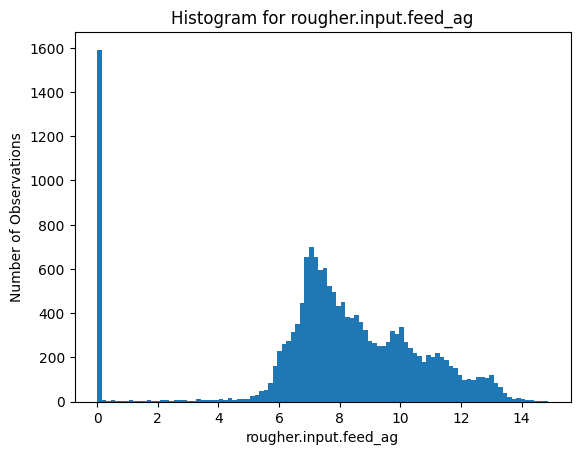

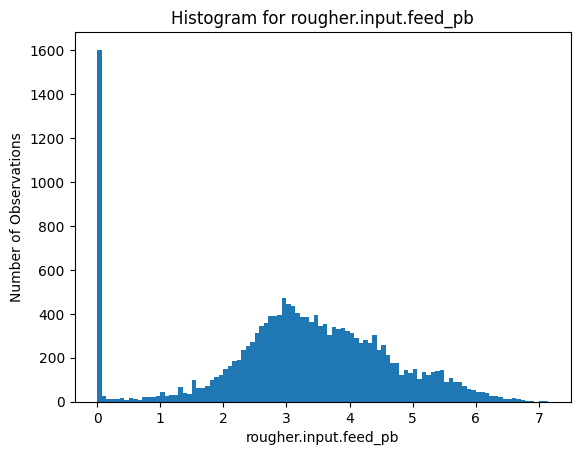

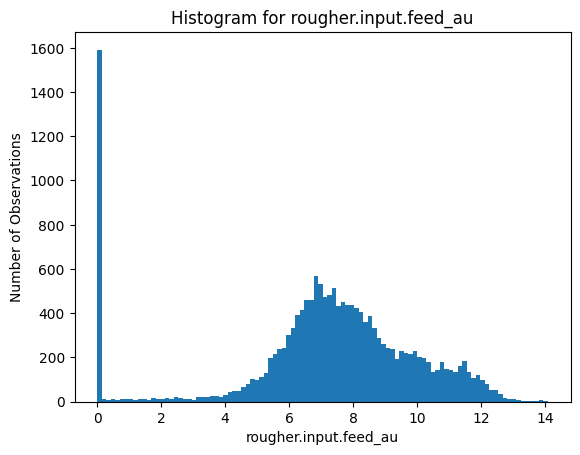

Stage 2


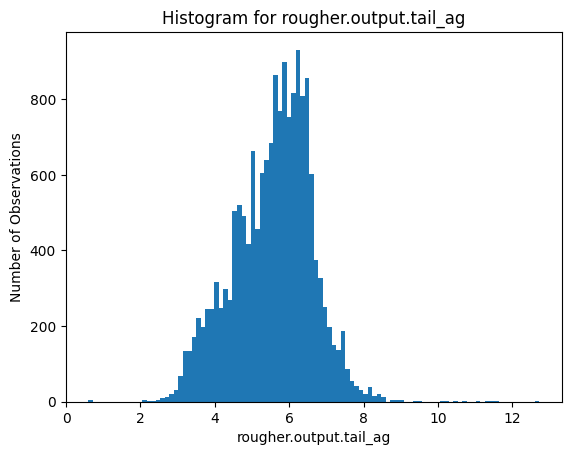

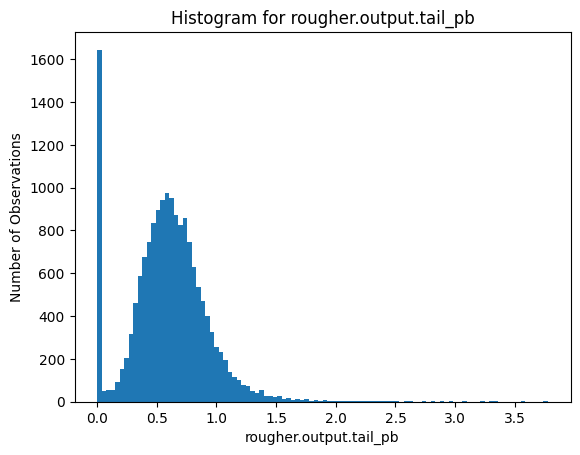

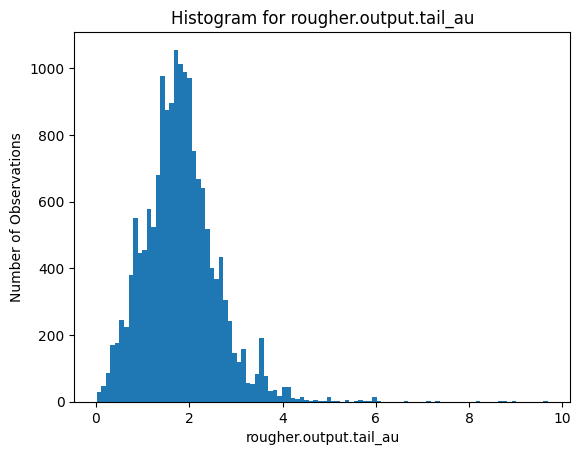

Stage 3


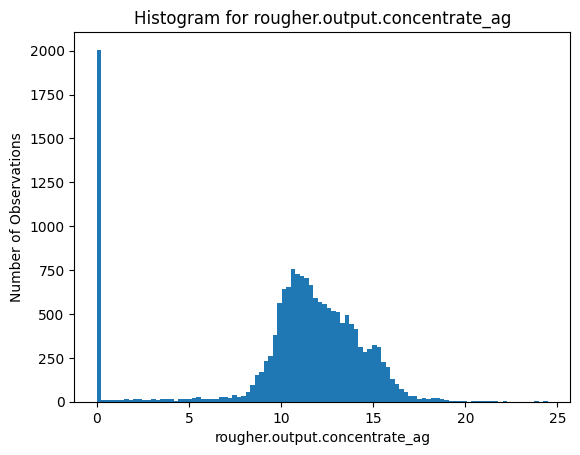

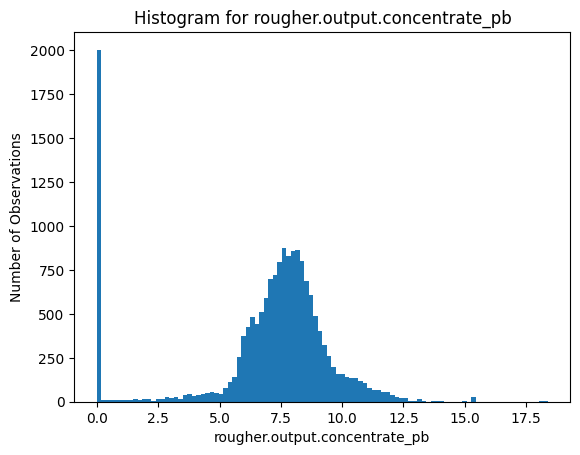

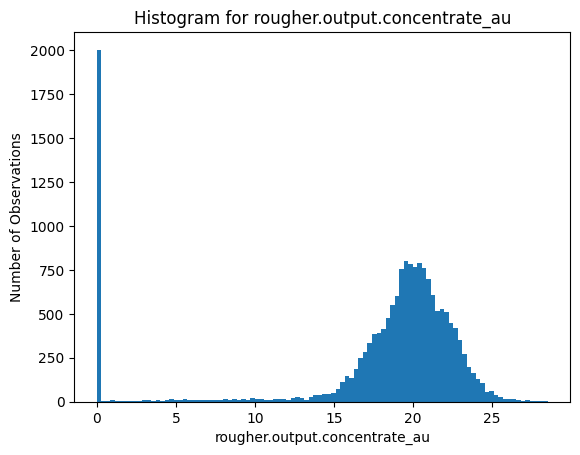

Stage 4


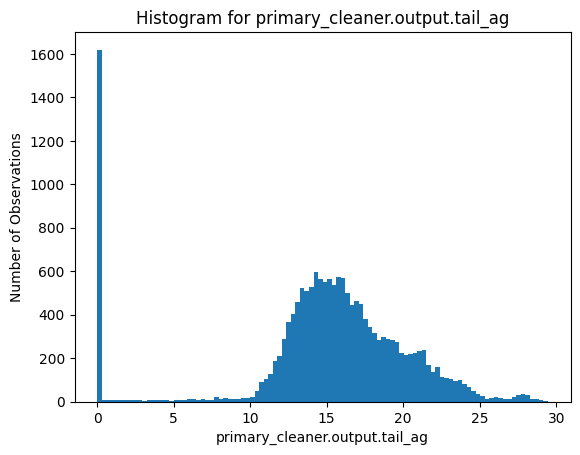

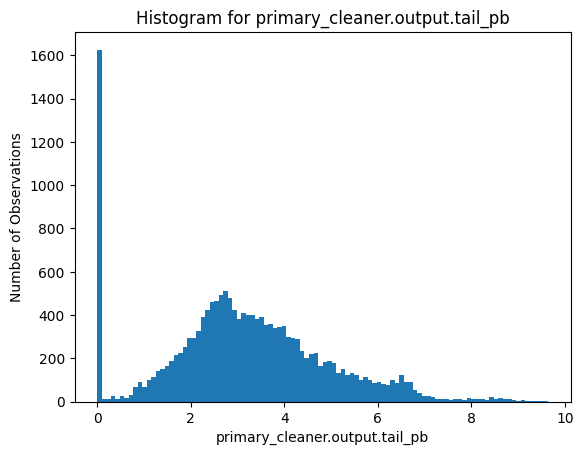

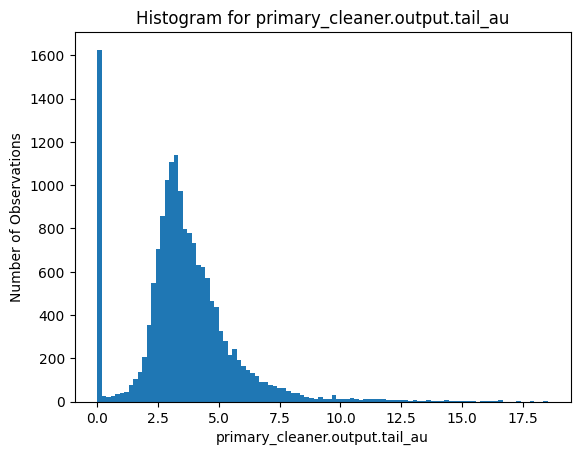

Stage 5


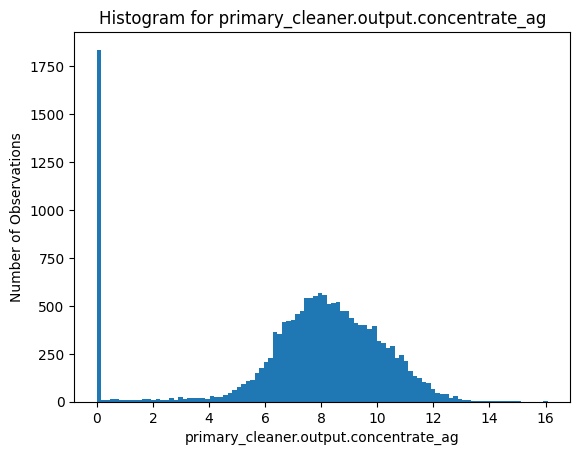

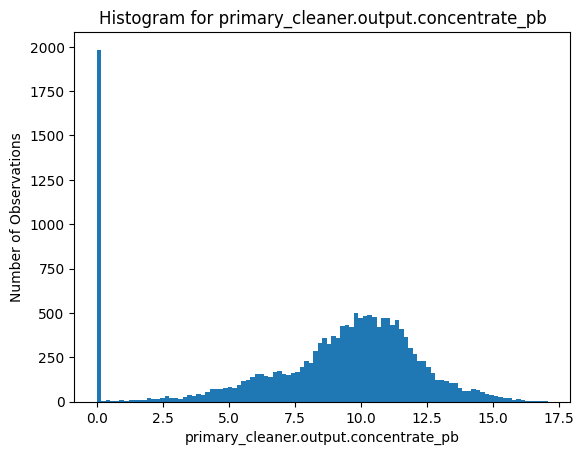

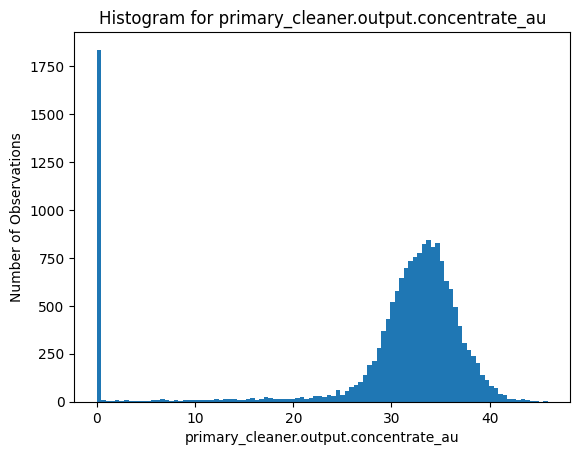

Stage 6


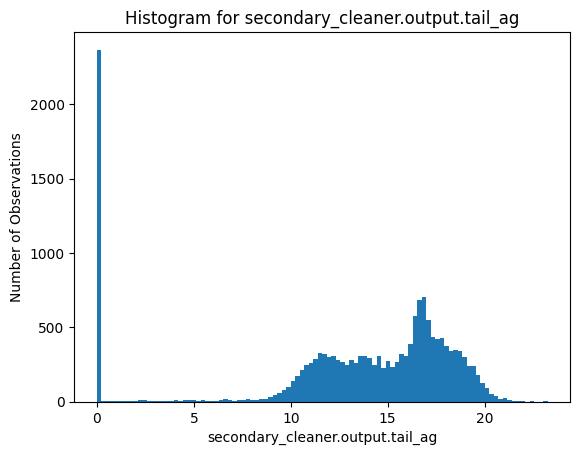

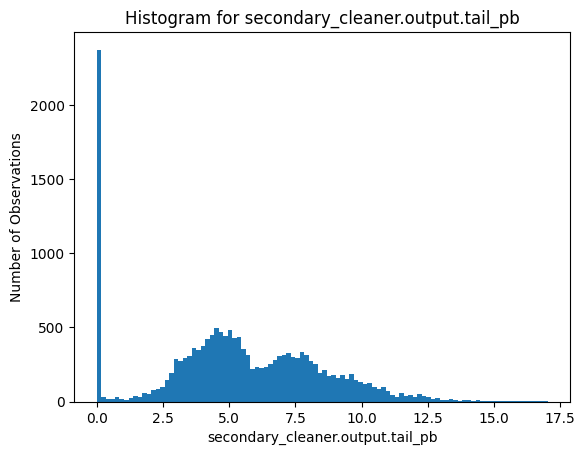

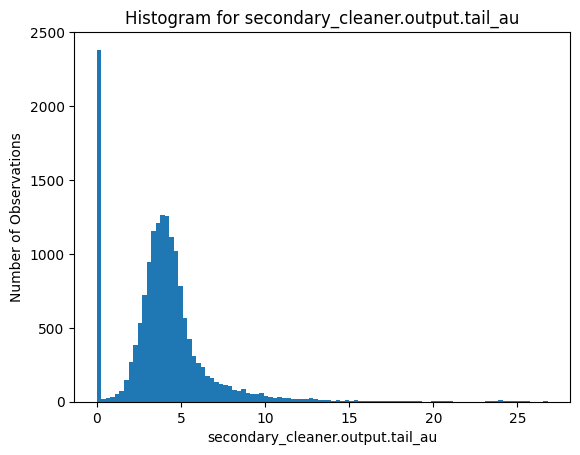

Stage 7


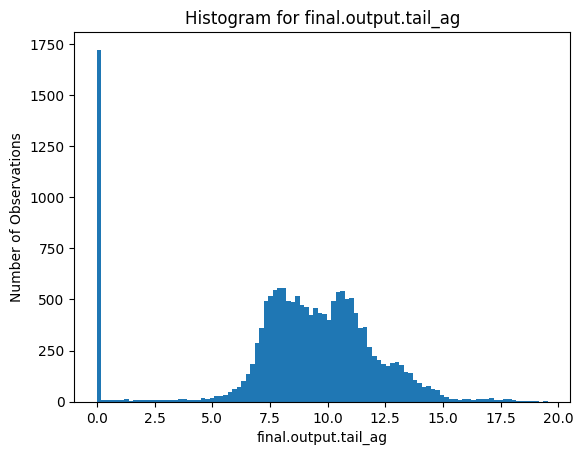

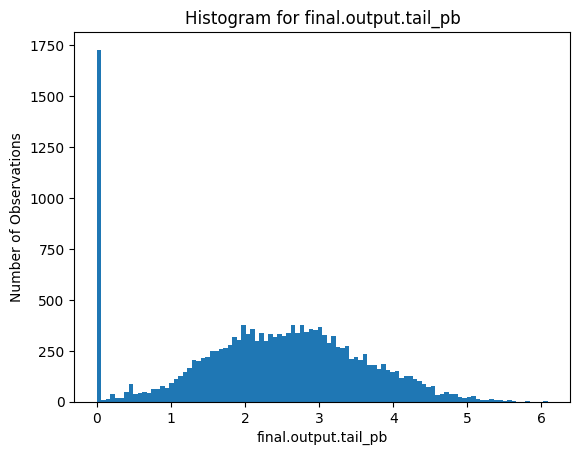

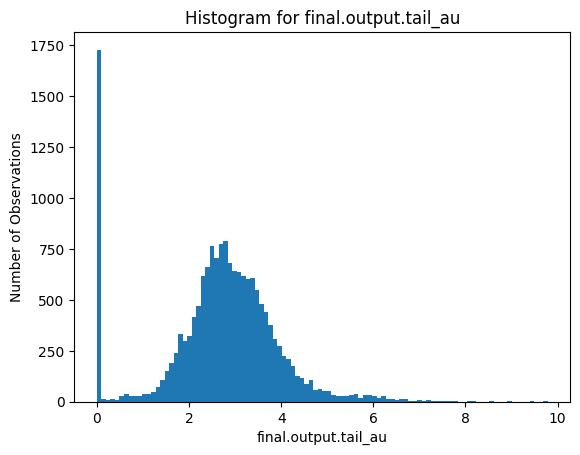

Stage 8


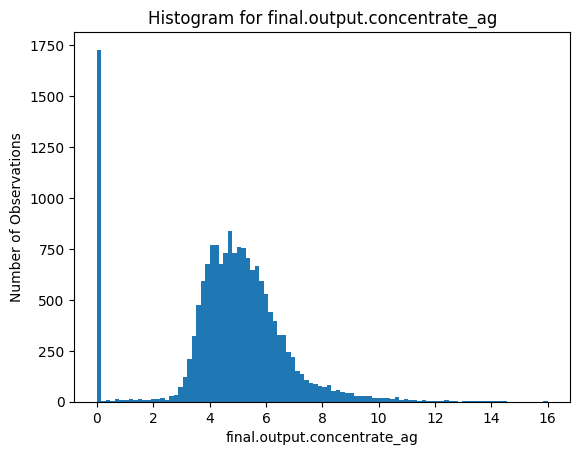

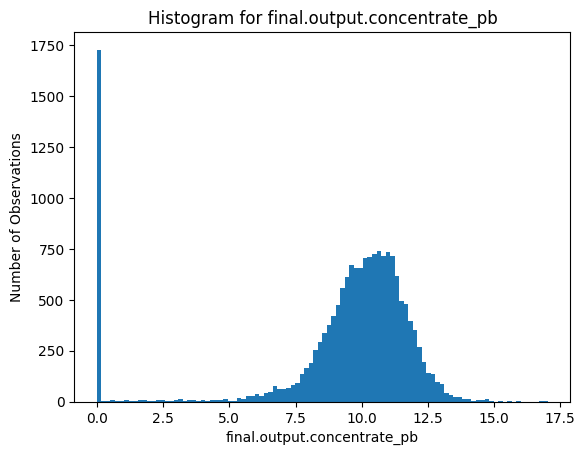

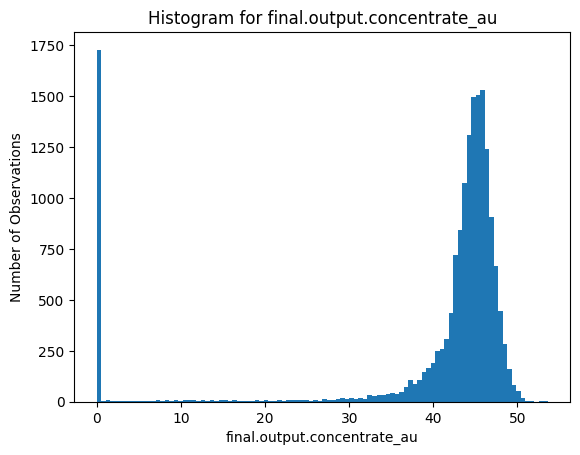

In [21]:
# Examine the distributions of metal concentrations at different purification stages in the df_train dataframe

for stage in range(1,9):
    print('Stage', stage)
    for metal in range(3):
        histo(df_train, stage_metals[stage][metal])

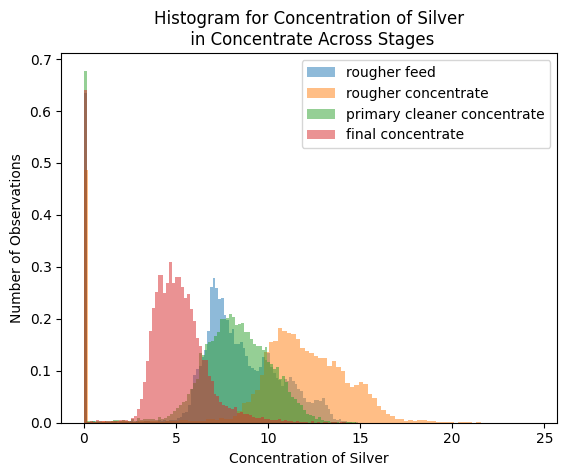

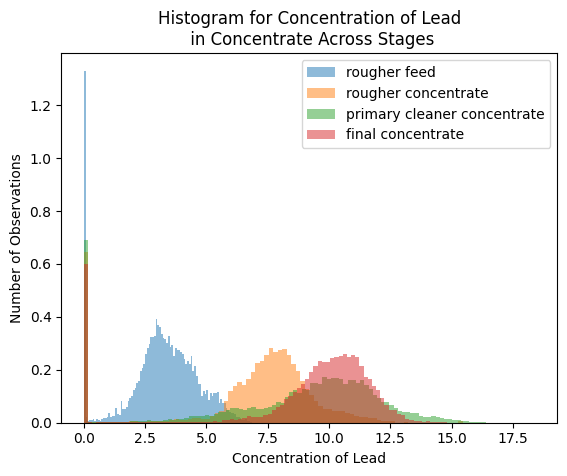

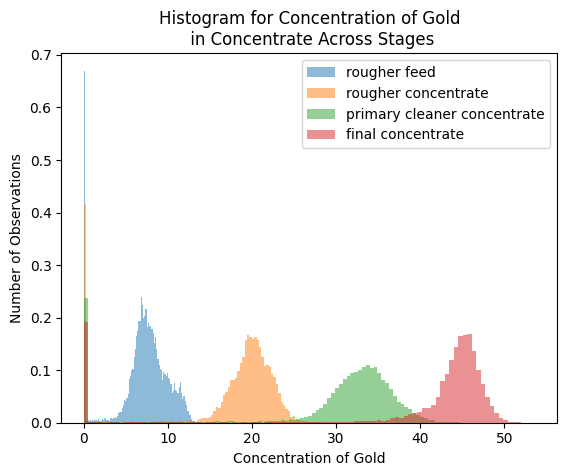

In [22]:
# Examine the distributions of metal concentrations in the concentrate at relevant stages in the df_train dataframe

for metal in range(3):
    for stage in [1, 3, 5, 8]:
        plt.hist(df_train[stage_metals[stage][metal]], alpha=0.5, label=stages[stage-1], density=True, bins=100)
    
    metals = ['Silver', 'Lead', 'Gold']
    plt.xlabel(f"Concentration of {metals[metal]}")
    plt.ylabel('Number of Observations')
    plt.title(f"Histogram for Concentration of {metals[metal]}\n in Concentrate Across Stages")
    plt.legend()
    plt.show()

The purpose of this process is to concentrate gold, so it makes sense that the concentration of gold increases as the stages progress (7.14, 17.34, 29.04, 39.32). The other metal concentrations are less impressive with silver rising and falling (7.80, 10.54, 7.39, 4.70) and lead increasing modestly (3.19, 6.86, 8.49, 9.08). Tail residues also rise somewhat until dropping in the final stage. The key takeaway is that the process works, gold is successfully concentrated.

Rougher input feed size for the training data set


count    16860.000000
mean        60.188595
std         30.522242
min          9.659576
25%         47.548897
50%         54.066003
75%         65.397249
max        484.967466
Name: rougher.input.feed_size, dtype: float64


Rougher input feed size for the test data set


count    5856.000000
mean       55.898866
std        22.707969
min         0.046369
25%        43.852884
50%        49.964796
75%        61.628003
max       477.445473
Name: rougher.input.feed_size, dtype: float64

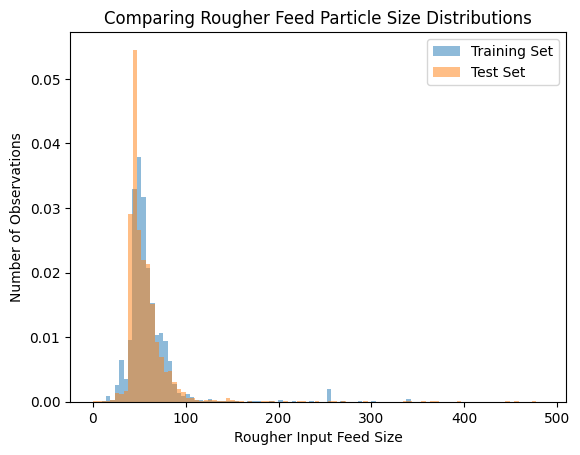

In [23]:
# Compare the rougher feed particle size distributions for the df_train and df_test dataframes

print('Rougher input feed size for the training data set')
display(df_train['rougher.input.feed_size'].describe())
print()
print('Rougher input feed size for the test data set')
display(df_test['rougher.input.feed_size'].describe())
print()
plt.hist(df_train['rougher.input.feed_size'], alpha=0.5, label='Training Set', density=True, bins=100)
plt.hist(df_test['rougher.input.feed_size'], alpha=0.5, label='Test Set', density=True, bins=100)
plt.xlabel('Rougher Input Feed Size')
plt.ylabel('Number of Observations')
plt.title('Comparing Rougher Feed Particle Size Distributions')
plt.legend()
plt.show()

Primary cleaner input feed size for the training data set


count    16860.000000
mean         7.297285
std          0.619166
min          1.080000
25%          6.940000
50%          7.285000
75%          7.700000
max         10.470000
Name: primary_cleaner.input.feed_size, dtype: float64


Primary cleaner input feed size for the test data set


count    5856.000000
mean        7.264651
std         0.611526
min         5.650000
25%         6.885625
50%         7.259333
75%         7.650000
max        15.500000
Name: primary_cleaner.input.feed_size, dtype: float64

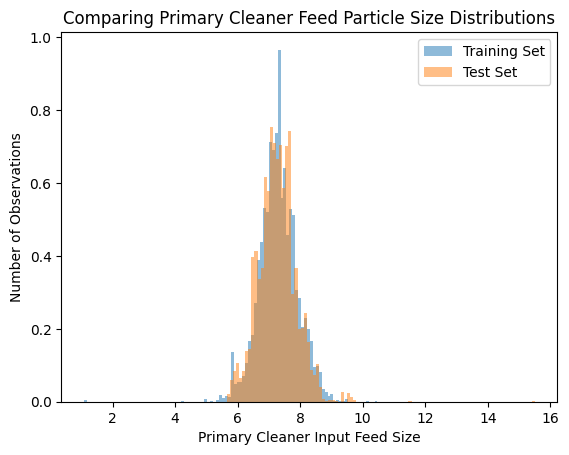

In [24]:
# Compare the primary feed particle size distributions for the df_train and df_test dataframes

print('Primary cleaner input feed size for the training data set')
display(df_train['primary_cleaner.input.feed_size'].describe())
print()
print('Primary cleaner input feed size for the test data set')
display(df_test['primary_cleaner.input.feed_size'].describe())
print()
plt.hist(df_train['primary_cleaner.input.feed_size'], alpha=0.5, label='Training Set', density=True, bins=100)
plt.hist(df_test['primary_cleaner.input.feed_size'], alpha=0.5, label='Test Set', density=True, bins=100)
plt.xlabel('Primary Cleaner Input Feed Size')
plt.ylabel('Number of Observations')
plt.title('Comparing Primary Cleaner Feed Particle Size Distributions')
plt.legend()
plt.show()

In [25]:
# Test the difference between feed particle size distributions for the df_train and df_test dataframes

ttest = st.ttest_ind(df_train['rougher.input.feed_size'], df_test['rougher.input.feed_size'], equal_var=False)
levenes = st.levene(df_train['rougher.input.feed_size'], df_test['rougher.input.feed_size'], center='median')
print("Comparing rougher feed particle size distributions for the df_train and df_test dataframes")
print(f"t-test: statistic = {ttest[0]:.2f}, p = {ttest[1]:.4f}")
print(f"Levene's test: statistic = {levenes[0]:.2f}, p = {levenes[1]:.4f}")
print()

ttest = st.ttest_ind(df_train['primary_cleaner.input.feed_size'], df_test['primary_cleaner.input.feed_size'])
levenes = st.levene(df_train['primary_cleaner.input.feed_size'], df_test['primary_cleaner.input.feed_size'], center='median')
print("Comparing primary cleaner feed particle size distributions for the df_train and df_test dataframes")
print(f"t-test: statistic = {ttest[0]:.2f}, p = {ttest[1]:.4f}")
print(f"Levene's test: statistic = {levenes[0]:.2f}, p = {levenes[1]:.4f}")

Comparing rougher feed particle size distributions for the df_train and df_test dataframes
t-test: statistic = 11.33, p = 0.0000
Levene's test: statistic = 35.99, p = 0.0000

Comparing primary cleaner feed particle size distributions for the df_train and df_test dataframes
t-test: statistic = 3.49, p = 0.0005
Levene's test: statistic = 0.01, p = 0.9053


The distributions of rougher feed particle size are fairly consistent between the df_train (mean = 60.19, median = 54.06, standard deviation = 30.52) and df_test (mean = 55.90, median = 49.96, standard deviation = 22.71) datasets with comparable descriptives and shapes. The training data mean is shifted 4.29 units to the right, a statistically significant difference (t = 11.33, p < 0.05).

The distributions of primary feed particle size are very similar between the df_train (mean = 7.30, median = 7.29, standard deviation = 0.62) and df_test (mean = 7.26, median = 7.26, standard deviation = 0.61) datasets with quite comparable descriptives and shapes. The training data range is shifted about 5 units to the left and its mean is shifted only 0.04 to the right but that difference is statistically significant (t = 3.49, p < 0.05).

Although the means are significantly different, the large number of observations in the datasets provide a lot of power to pick up such differences. On a practical level, the feed particle size distributions are nearly equivalent. I doubt they will cause problems for the model, but I will scale the features as a precaution.

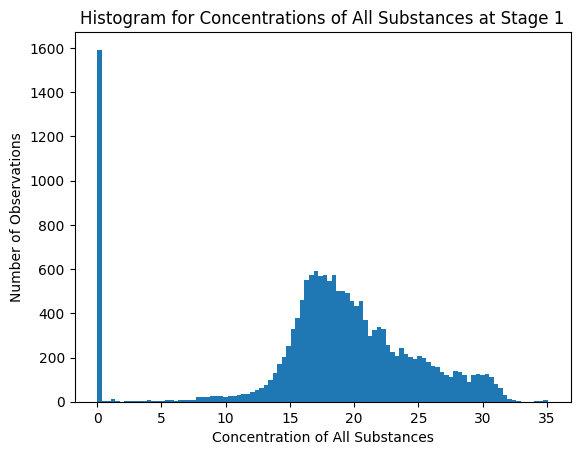

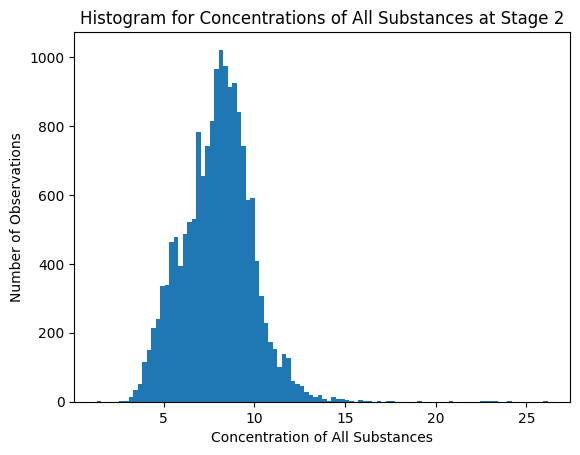

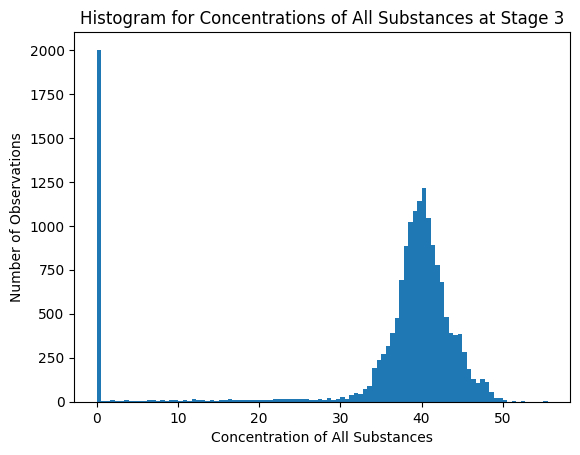

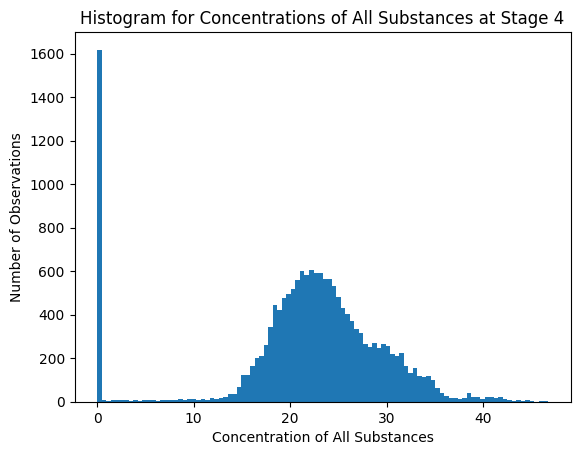

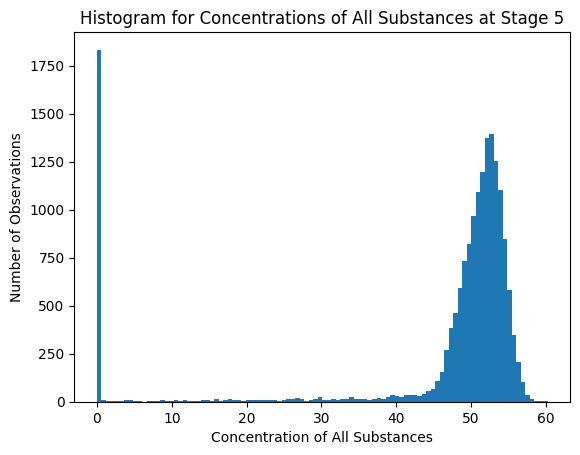

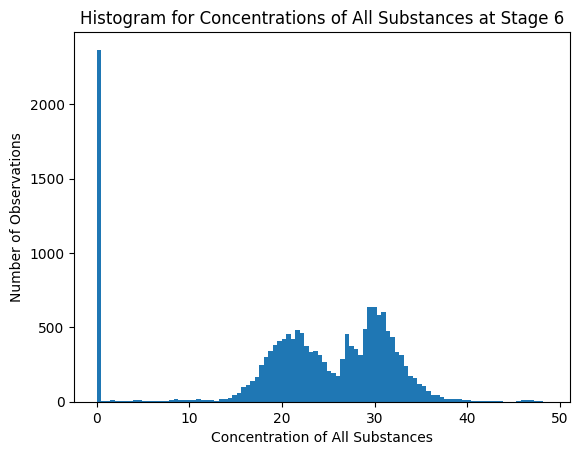

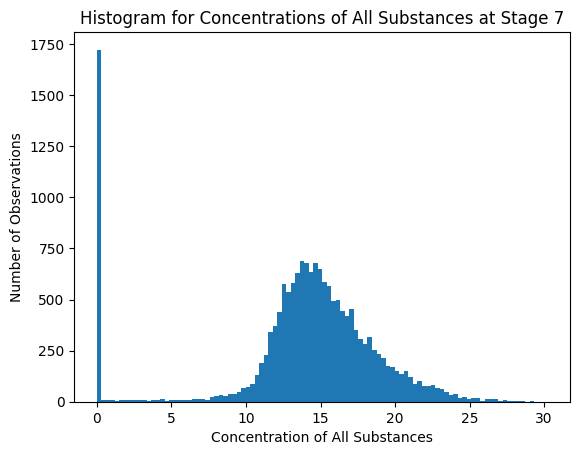

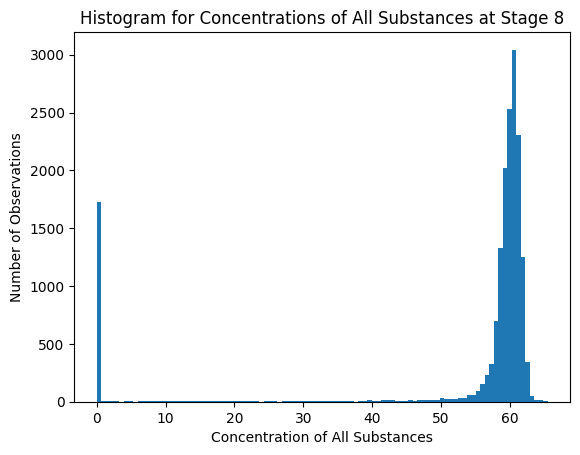

In [26]:
# Examine the total concentrations of all substances at different stages in the df_train dataframe

for stage in range(1,9):
    all_substances = df_train[stage_metals[stage][0]] + df_train[stage_metals[stage][1]] + df_train[stage_metals[stage][2]]
    
    plt.hist(all_substances, bins=100)
    plt.xlabel('Concentration of All Substances')
    plt.ylabel('Number of Observations')
    plt.title(f'Histogram for Concentrations of All Substances at Stage {stage}')
    plt.show()

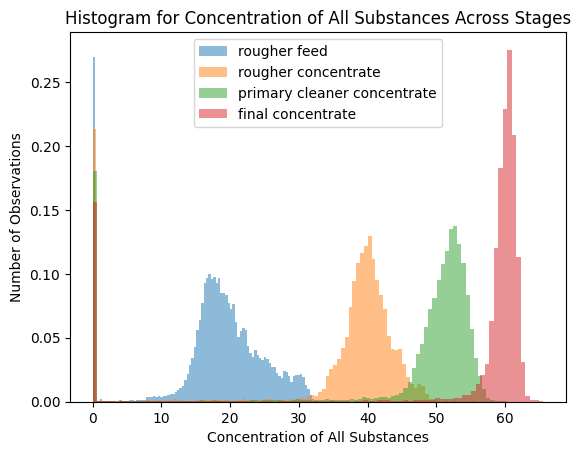

In [27]:
# Examine the total concentrations of all substances in the concentrate at relevant stages in the df_train dataframe

all_substances_dict = {}
for stage in [1, 3, 5, 8]:
    all_substances = df_train[stage_metals[stage][0]] + df_train[stage_metals[stage][1]] + df_train[stage_metals[stage][2]]
    all_substances_dict[stage] = all_substances

    plt.hist(all_substances, alpha=0.5, label=stages[stage-1], density=True, bins=100)

plt.xlabel('Concentration of All Substances')
plt.ylabel('Number of Observations')
plt.title(f'Histogram for Concentration of All Substances Across Stages')
plt.legend()
plt.show()

In [28]:
# Examine common values for all substance concentrations in the concentrate at relevant stages in the df_train dataframe

for stage in all_substances_dict.keys():
    print('Stage:', stage)
    display(all_substances_dict[stage].describe())
    print('Most common values:')
    display(all_substances_dict[stage].value_counts().head(5))
    print('% of values <= 0.03:', (all_substances_dict[stage] <= 0.03).sum())
    print()

Stage: 1


count    16860.000000
mean        18.136907
std          7.407993
min          0.000000
25%         16.093185
50%         18.713815
75%         22.327806
max         35.071987
dtype: float64

Most common values:


0.000000     1213
0.030000      373
20.606399      22
19.440479      10
20.618440       5
dtype: int64

% of values <= 0.03: 1586

Stage: 3


count    16860.000000
mean        34.740842
std         13.697400
min          0.000000
25%         36.609887
50%         39.457951
75%         41.635606
max         55.568687
dtype: float64

Most common values:


0.000000     1547
0.030000      447
42.344688      22
34.327270      11
40.769592       7
dtype: int64

% of values <= 0.03: 1995

Stage: 5


count    16860.000000
mean        44.926044
std         16.778057
min          0.000000
25%         48.246379
50%         51.245302
75%         53.176751
max         60.269003
dtype: float64

Most common values:


0.000000     1284
0.030000      542
53.246413       5
48.705482       5
50.580244       4
dtype: int64

% of values <= 0.03: 1826

Stage: 8


count    16860.000000
mean        53.101335
std         18.691789
min          0.000000
25%         58.523841
50%         59.984051
75%         60.934848
max         65.575259
dtype: float64

Most common values:


0.000000     1320
0.030000      404
58.653404      22
58.026877      11
60.284920       8
dtype: int64

% of values <= 0.03: 1724



In [29]:
# Examine common values for all substances in the concentrate at relevant stages in the df_train_calc dataframe

all_substances_dict_calc = {}
for stage in [1, 3, 5, 8]:
    all_substances = df_train_calc[stage_metals[stage][0]] + df_train_calc[stage_metals[stage][1]] + df_train_calc[stage_metals[stage][2]]
    all_substances_dict_calc[stage] = all_substances

for stage in all_substances_dict_calc.keys():
    print('Stage:', stage)
    display(all_substances_dict_calc[stage].describe())
    print('Most common values:')
    display(all_substances_dict_calc[stage].value_counts().head(5))
    print('% of values <= 0.03:', (all_substances_dict_calc[stage] <= 0.03).sum())
    print()

Stage: 1


count    14164.000000
mean        19.989330
std          4.393155
min          0.030000
25%         16.877827
50%         19.200581
75%         22.583623
max         32.840164
dtype: float64

Most common values:


19.440479    10
0.030000      6
19.437493     5
20.618440     5
18.869536     3
dtype: int64

% of values <= 0.03: 6

Stage: 3


count    14287.000000
mean        38.806960
std          7.119287
min          0.000000
25%         37.908796
50%         39.851873
75%         41.798784
max         55.568687
dtype: float64

Most common values:


0.000000     320
34.327270     11
0.030000       7
40.769592      6
37.142156      4
dtype: int64

% of values <= 0.03: 327

Stage: 5


count    14164.000000
mean        50.016830
std          8.414355
min          0.000000
25%         49.630298
50%         51.791929
75%         53.440696
max         60.269003
dtype: float64

Most common values:


0.030000     130
0.000000     101
48.705482      5
53.246413      5
53.717978      3
dtype: int64

% of values <= 0.03: 231

Stage: 8


count    14282.000000
mean        58.945520
std          7.136577
min          0.000000
25%         59.175304
50%         60.247322
75%         61.050125
max         64.968881
dtype: float64

Most common values:


0.000000     99
0.030000     18
58.026877    11
60.284920     7
60.073814     5
dtype: int64

% of values <= 0.03: 117



Considering the total concentrations of all substances in the concentrate at different purification stages, the distributions look fairly healthy. They are relatively normal and lack any noticeable outliers with one notable exception. Every stage has a strange cluster of very low values (mostly 0 but also some 0.03) that sticks out, comprising between 1,586 and 1,995 values (9.4% - 11.8% of the data) per stage. I do not know why those values are there. They might indicate aberrations, mistakes, or lost data. 

The excess zeros are almost completely eliminated by using the df_train_calc dataframe. I dropped from it all rows with undefined values (from division by zero) for the calculated rougher and final recovery columns. The odd surplus of 0.03 values and a few zeros remain, but they account for less than 2.5% of rows, a much more manageable amount. The dropped values are incompatible with the formula given for recovery, which calls into question their validity. Some data being inadvertently lost or misrecorded as zero seems more likely than the formula for recovery being wrong.

It also seems dubious that many metal concentrations would be near zero at any stage, much less all of them. The excess zeros certainly look out of place given the rest of the distributions. I am loath to fill them with anything without a better understanding of why the observations are faulty. It would also require filling thousands of values in at least 22 out of the 24 columns used in the metals-per-stage analysis, no small intervention. Replacing that much data might undermine the integrity of the models. Given all of those considerations, I will replace df_train with df_train_calc, dropping most rows with suspicious zero values. The relatively few low values that remain might conceivably be legitimate and I feel less justified in dropping them than the others. This reduces the dataset by 15%, but I think losing the inappropriate data is safer than allowing it to distort the models. The reduced dataset is still quite large (14,287 observations), perfectly adequate for modeling.

In [30]:
# Replace df_train with df_train_calc and fill missing values with the forward filling method

df_train = df_train_calc.copy()
df_train.fillna(method='ffill', inplace=True)

print(df_train.isna().sum().sum())
df_train.describe()

0


,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,recovery_rougher
count,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000,...,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000,14287.000000
mean,5.119423,10.071401,9.050609,43.736949,66.383351,9.574072,2.569887,10.459810,2.910238,132.564646,...,-478.777367,15.492430,-460.406736,16.770683,-483.952419,13.067582,-484.157672,19.583520,-506.829824,82.394201
std,1.422327,1.812220,2.957345,5.918529,10.624362,2.375414,0.996528,3.071571,0.923826,40.188543,...,50.911966,5.252011,58.873342,5.840551,37.883984,5.771513,40.165959,5.757672,37.525767,15.096808
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003112,...,-799.709069,0.000000,-799.889113,-0.372054,-797.142475,0.646208,-800.006180,0.195324,-809.398668,-0.000000
25%,4.199974,9.273072,7.380822,43.228523,62.441715,7.985727,1.877434,8.768168,2.361992,106.140065,...,-500.632100,11.900697,-500.151496,11.085728,-500.368562,8.995028,-500.106337,14.989455,-500.750226,79.818372
50%,4.987677,10.282433,8.781903,44.858284,67.391104,9.466294,2.572389,10.492616,2.847668,132.672889,...,-499.682744,14.975182,-499.395372,17.929185,-499.703214,11.997439,-499.914617,19.984696,-500.061052,85.235997
75%,5.858264,11.165575,10.425775,46.156837,72.337847,10.996183,3.233906,11.920894,3.434672,159.537378,...,-477.721262,20.058060,-400.042641,21.355760,-487.950341,17.983452,-456.184419,24.991438,-499.531096,90.131691
max,16.001945,17.031899,18.124851,53.611374,100.000000,19.552149,5.639565,22.317730,8.197408,250.127834,...,-245.239184,24.007913,-145.071088,43.709931,-275.073125,27.926001,-157.396071,32.188906,-104.427459,100.000000


# Model the Data #

In [31]:
# Create a function to calculate sMAPE and final sMAPE

def sMAPE(y, y_hat):
    if len(y) != len(y_hat): return 'NA'
    n = len(y)
    return (100 / n) * (abs(y - y_hat) / ((abs(y) + abs(y_hat))/2)).sum()

def final_sMAPE(y_rougher, y_hat_rougher, y_final, y_hat_final):
    return .25 * sMAPE(y_rougher, y_hat_rougher) + .75 * sMAPE(y_final, y_hat_final)

In [32]:
# Standardize features in df_train for modeling

test_features = list(df_test.columns)[1:]
scaler = StandardScaler()
scaler.fit(df_train[test_features])
df_train[test_features] = scaler.transform(df_train[test_features])
scaler.fit(df_test[test_features])
df_test[test_features] = scaler.transform(df_test[test_features])

In [33]:
# Train and cross-validate a linear regression model for rougher.output.recovery in df_train after shuffling the data

test_features = list(df_test.columns)[1:]
features = df_train[test_features]
target = df_train['rougher.output.recovery']

sMAPE_scorer = make_scorer(sMAPE, greater_is_better=False)
model = LinearRegression()

scores = -cross_val_score(model, features, target, scoring=sMAPE_scorer, cv=5)
final_score = sum(scores) / len(scores)

print('Average model evaluation score:', final_score)
print(scores)

Average model evaluation score: 13.955616784999204
[16.79792855  8.69822882 18.83532057 15.20779366 10.23881232]


I intend to test these models on the df_test dataframe eventually, so I will train them all using only the features available in that dataframe. The training data itself comes from the df_train dataframe. I created a custom scorer to use sMAPE as the scoring function. Because the cross validation algorithm trains by maximizing scores and sMAPE needs to be minimized, I specified that greater values are not good. That produces negative scores, but I will negate them before printing to restore their original format.

The cross-validated linear regression models predicting rougher.output.recovery had an average sMAPE of 13.96.

In [34]:
# Find the best fitting decision tree classifier model for rougher.output.recovery in df_train

test_features = list(df_test.columns)[1:]
features = df_train[test_features]
target = df_train['rougher.output.recovery']

sMAPE_scorer = make_scorer(sMAPE, greater_is_better=False)

best_dt_model = None
best_dt_depth = 0
best_dt_result = np.inf
dt_results = []

for depth in range (1, 26):
    model = DecisionTreeRegressor(random_state=12345, max_depth=depth)
    result = -np.mean(cross_val_score(model, features, target, scoring=sMAPE_scorer, cv=5))
    print(f'model depth = {depth}, sMAPE = {result:.4f}')
    dt_results.append([depth, result]) 
    if result < best_dt_result:
        best_dt_depth = depth
        best_dt_model = model
        best_dt_result = result

dt_results = pd.DataFrame(dt_results, columns=['depth', 'result'])
            
print()
print("Best decision tree model:")
print("Depth:", best_dt_depth)
print(f"sMAPE: {best_dt_result:.4f}")

model depth = 1, sMAPE = 13.0806
model depth = 2, sMAPE = 12.5349
model depth = 3, sMAPE = 13.8514
model depth = 4, sMAPE = 12.6991
model depth = 5, sMAPE = 14.0958
model depth = 6, sMAPE = 15.0418
model depth = 7, sMAPE = 13.8958
model depth = 8, sMAPE = 14.6044
model depth = 9, sMAPE = 15.3886
model depth = 10, sMAPE = 16.9162
model depth = 11, sMAPE = 16.5216
model depth = 12, sMAPE = 19.0457
model depth = 13, sMAPE = 20.2367
model depth = 14, sMAPE = 21.4569
model depth = 15, sMAPE = 21.5814
model depth = 16, sMAPE = 21.3671
model depth = 17, sMAPE = 21.2933
model depth = 18, sMAPE = 22.3897
model depth = 19, sMAPE = 21.8376
model depth = 20, sMAPE = 22.6246
model depth = 21, sMAPE = 22.3199
model depth = 22, sMAPE = 23.2069
model depth = 23, sMAPE = 23.1911
model depth = 24, sMAPE = 23.9199
model depth = 25, sMAPE = 22.7243

Best decision tree model:
Depth: 2
sMAPE: 12.5349


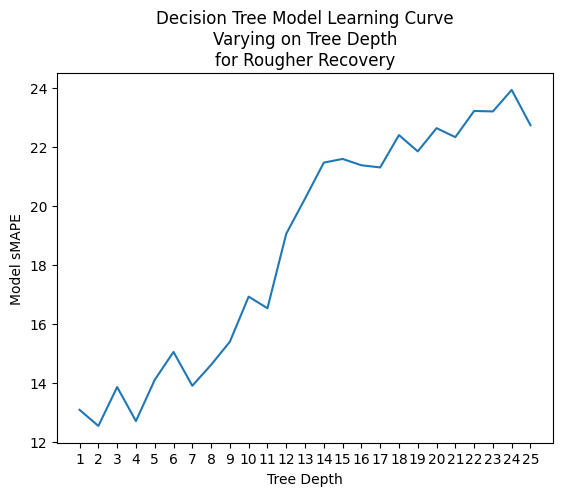

In [35]:
# plot results for the decision tree regressor models predicting rougher.output.recovery with varying depths 

plt.plot(dt_results['depth'], dt_results['result'])
plt.xlabel('Tree Depth')
plt.ylabel('Model sMAPE')
plt.title('Decision Tree Model Learning Curve\nVarying on Tree Depth\nfor Rougher Recovery')
plt.xticks(range(1, len(dt_results)+1))
plt.show()

The best-performing cross-validated decision tree model predicting rougher.output.recovery had a maximum depth of 2 and an average sMAPE score of 12.53. Model performance exceeded the linear regression model at a maximum depth of 1 (sMAPE = 13.08).  A precipitous drop in performance for maximum depths greater than 4 suggests that further improvement is very unlikely.

In [36]:
# Find the best fitting random forest regressor model for rougher.output.recoery in df_train by varying estimators and depth

test_features = list(df_test.columns)[1:]
features = df_train[test_features]
target = df_train['rougher.output.recovery']

sMAPE_scorer = make_scorer(sMAPE, greater_is_better=False)

best_rf_model = None
best_rf_est = 0
best_rf_depth = 0
best_rf_result = np.inf
rf_results = []
            
for est in range(1, 11):
    for depth in range (1, 16):
        model = RandomForestRegressor(random_state=12345, n_estimators=est, max_depth=depth)
        result = -np.mean(cross_val_score(model, features, target, scoring=sMAPE_scorer, cv=5, n_jobs=1))
        print(f'model estimators = {est}, depth = {depth}, sMAPE = {result:.4f}')
        rf_results.append([est, depth, result]) 
        if result < best_rf_result:
            best_rf_est = est
            best_rf_depth = depth
            best_rf_model = model
            best_rf_result = result

rf_results = pd.DataFrame(rf_results, columns=['est', 'depth', 'result'])
            
print()
print("Best random forest model:")
print("Estimators:", best_rf_est)
print("Depth:", best_rf_depth)
print(f"sMAPE: {best_rf_result:.4f}")

model estimators = 1, depth = 1, sMAPE = 13.2205
model estimators = 1, depth = 2, sMAPE = 12.5126
model estimators = 1, depth = 3, sMAPE = 12.4681
model estimators = 1, depth = 4, sMAPE = 12.3460
model estimators = 1, depth = 5, sMAPE = 12.4246
model estimators = 1, depth = 6, sMAPE = 12.7772
model estimators = 1, depth = 7, sMAPE = 12.9189
model estimators = 1, depth = 8, sMAPE = 14.9537
model estimators = 1, depth = 9, sMAPE = 15.4333
model estimators = 1, depth = 10, sMAPE = 15.7134
model estimators = 1, depth = 11, sMAPE = 15.6398
model estimators = 1, depth = 12, sMAPE = 16.8127
model estimators = 1, depth = 13, sMAPE = 17.2306
model estimators = 1, depth = 14, sMAPE = 16.9465
model estimators = 1, depth = 15, sMAPE = 18.2496
model estimators = 2, depth = 1, sMAPE = 13.1343
model estimators = 2, depth = 2, sMAPE = 12.7586
model estimators = 2, depth = 3, sMAPE = 12.2431
model estimators = 2, depth = 4, sMAPE = 12.0706
model estimators = 2, depth = 5, sMAPE = 12.0638
model estimato

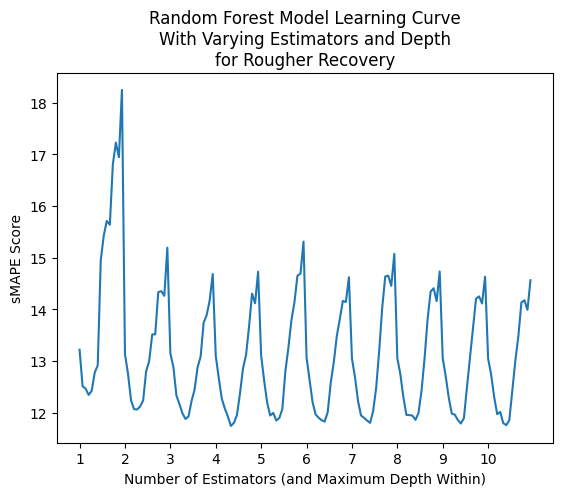

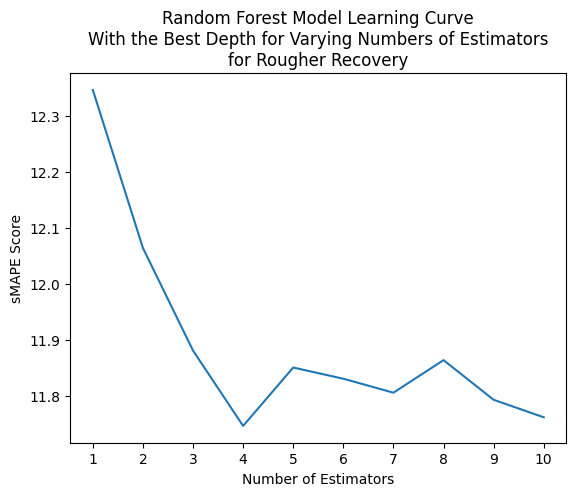

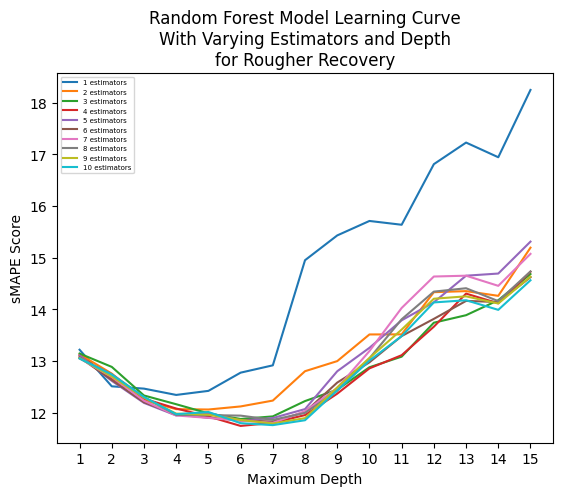

In [37]:
# plot results for random forest regressor models predicting rougher.output.recovery with varying estimators and depths

n_est = len(rf_results['est'].unique())
n_depth = len(rf_results['depth'].unique())
est_by_depth = [x + 1 + y / n_depth for x in range(n_est) for y in range(n_depth)]

plt.plot(est_by_depth, rf_results['result'])
plt.xlabel('Number of Estimators (and Maximum Depth Within)')
plt.ylabel('sMAPE Score')
plt.title('Random Forest Model Learning Curve\nWith Varying Estimators and Depth\nfor Rougher Recovery')
plt.xticks(range(1, n_est+1))
plt.show()
print()

rf_max = pd.DataFrame(rf_results.groupby('est')['result'].min()).reset_index()

plt.plot(rf_max['est'], rf_max['result'])
plt.xlabel('Number of Estimators')
plt.ylabel('sMAPE Score')
plt.title('Random Forest Model Learning Curve\nWith the Best Depth for Varying Numbers of Estimators\nfor Rougher Recovery')
plt.xticks(range(1, n_est+1))
plt.show()
print()

est_results = {}
for row in range(len(rf_results)):
    est = rf_results.loc[row, 'est']
    val = rf_results.loc[row, 'result']
    est_results.setdefault(est, []).append(val)

for est in est_results.keys():
    plt.plot(range(1, len(est_results[est])+1), est_results[est], label=f"{est} estimators")
plt.xlabel('Maximum Depth')
plt.ylabel('sMAPE Score')
plt.title('Random Forest Model Learning Curve\nWith Varying Estimators and Depth\nfor Rougher Recovery')
plt.xticks(range(1, n_depth+1))
plt.legend(fontsize=5)
plt.show()

The best-performing cross-validated random forest model predicting rougher.output.recovery had 4 estimators, a maximum depth of 6, and an average sMAPE score of 11.75. Model performance exceeded the best decision tree regressor model with 1 estimator and a maximum depth of 2 (sMAPE = 12.51). Performance plateaued after a maximum depth of 4 and dropped precipitously for more than 8 estimators, suggesting that further improvement is very unlikely.

In [38]:
# Train and cross-validate a linear regression model for final.output.recovery in df_train

test_features = list(df_test.columns)[1:]
features = df_train[test_features]
target = df_train['final.output.recovery']

sMAPE_scorer = make_scorer(sMAPE, greater_is_better=False)
model = LinearRegression()

scores = -cross_val_score(model, features, target, scoring=sMAPE_scorer, cv=5)
final_score = sum(scores) / len(scores)

print('Average model evaluation score:', final_score)
print(scores)

Average model evaluation score: 12.518299184368791
[14.90427723 11.02927237 11.16313807 10.84955448 14.64525377]


In [39]:
# Find the best fitting decision tree classifier model for final.output.recovery in df_train by varying depth

test_features = list(df_test.columns)[1:]
features = df_train[test_features]
target = df_train['final.output.recovery']

sMAPE_scorer = make_scorer(sMAPE, greater_is_better=False)

best_dt_model = None
best_dt_depth = 0
best_dt_result = np.inf
dt_results = []

for depth in range (1, 26):
    model = DecisionTreeRegressor(random_state=12345, max_depth=depth)
    result = -np.mean(cross_val_score(model, features, target, scoring=sMAPE_scorer, cv=5))
    print(f'model depth = {depth}, sMAPE = {result:.4f}')
    dt_results.append([depth, result]) 
    if result < best_dt_result:
        best_dt_depth = depth
        best_dt_model = model
        best_dt_result = result

dt_results = pd.DataFrame(dt_results, columns=['depth', 'result'])
            
print()
print("Best decision tree model:")
print("Depth:", best_dt_depth)
print(f"sMAPE: {best_dt_result:.4f}")

model depth = 1, sMAPE = 11.3307
model depth = 2, sMAPE = 10.6866
model depth = 3, sMAPE = 11.0311
model depth = 4, sMAPE = 11.3551
model depth = 5, sMAPE = 11.3784
model depth = 6, sMAPE = 11.9382
model depth = 7, sMAPE = 13.0249
model depth = 8, sMAPE = 14.2004
model depth = 9, sMAPE = 15.8750
model depth = 10, sMAPE = 16.9340
model depth = 11, sMAPE = 17.0788
model depth = 12, sMAPE = 18.7380
model depth = 13, sMAPE = 18.9015
model depth = 14, sMAPE = 18.2535
model depth = 15, sMAPE = 19.7206
model depth = 16, sMAPE = 18.4594
model depth = 17, sMAPE = 19.1473
model depth = 18, sMAPE = 19.2815
model depth = 19, sMAPE = 18.3614
model depth = 20, sMAPE = 20.2072
model depth = 21, sMAPE = 21.0312
model depth = 22, sMAPE = 22.5752
model depth = 23, sMAPE = 21.7010
model depth = 24, sMAPE = 19.6406
model depth = 25, sMAPE = 22.8298

Best decision tree model:
Depth: 2
sMAPE: 10.6866


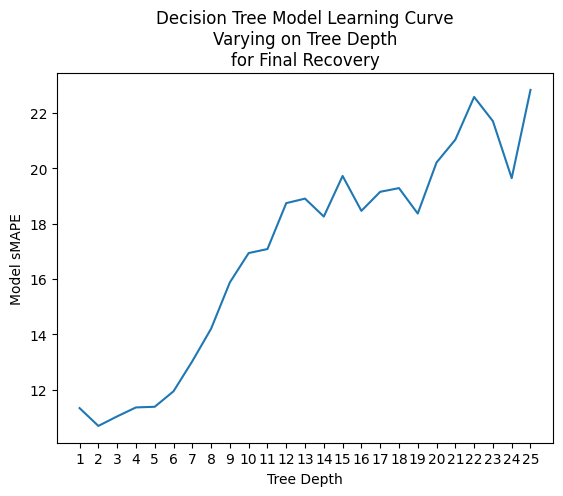

In [40]:
# plot results for the decision tree regressor models predicting final.output.recovery with varying depths

plt.plot(dt_results['depth'], dt_results['result'])
plt.xlabel('Tree Depth')
plt.ylabel('Model sMAPE')
plt.title('Decision Tree Model Learning Curve\nVarying on Tree Depth\nfor Final Recovery')
plt.xticks(range(1, len(dt_results)+1))
plt.show()

In [41]:
# Find the best fitting random forest regressor model for final.output.recoery in df_train by varying estimators and depth

test_features = list(df_test.columns)[1:]
features = df_train[test_features]
target = df_train['final.output.recovery']

sMAPE_scorer = make_scorer(sMAPE, greater_is_better=False)

best_rf_model = None
best_rf_est = 0
best_rf_depth = 0
best_rf_result = np.inf
rf_results = []
            
for est in range(1, 11):
    for depth in range (1, 16):
        model = RandomForestRegressor(random_state=12345, n_estimators=est, max_depth=depth)
        result = -np.mean(cross_val_score(model, features, target, scoring=sMAPE_scorer, cv=5, n_jobs=2))
        print(f'model estimators = {est}, depth = {depth}, sMAPE = {result:.4f}')
        rf_results.append([est, depth, result]) 
        if result < best_rf_result:
            best_rf_est = est
            best_rf_depth = depth
            best_rf_model = model
            best_rf_result = result

rf_results = pd.DataFrame(rf_results, columns=['est', 'depth', 'result'])
            
print()
print("Best random forest model:")
print("Estimators:", best_rf_est)
print("Depth:", best_rf_depth)
print(f"sMAPE: {best_rf_result:.4f}")

model estimators = 1, depth = 1, sMAPE = 11.2357
model estimators = 1, depth = 2, sMAPE = 10.8179
model estimators = 1, depth = 3, sMAPE = 11.3695
model estimators = 1, depth = 4, sMAPE = 11.1046
model estimators = 1, depth = 5, sMAPE = 11.0671
model estimators = 1, depth = 6, sMAPE = 13.5619
model estimators = 1, depth = 7, sMAPE = 15.7278
model estimators = 1, depth = 8, sMAPE = 19.7426
model estimators = 1, depth = 9, sMAPE = 20.9908
model estimators = 1, depth = 10, sMAPE = 21.1471
model estimators = 1, depth = 11, sMAPE = 20.9179
model estimators = 1, depth = 12, sMAPE = 20.0169
model estimators = 1, depth = 13, sMAPE = 20.1526
model estimators = 1, depth = 14, sMAPE = 22.1653
model estimators = 1, depth = 15, sMAPE = 20.6154
model estimators = 2, depth = 1, sMAPE = 11.1656
model estimators = 2, depth = 2, sMAPE = 10.7510
model estimators = 2, depth = 3, sMAPE = 10.9406
model estimators = 2, depth = 4, sMAPE = 10.8204
model estimators = 2, depth = 5, sMAPE = 10.4327
model estimato

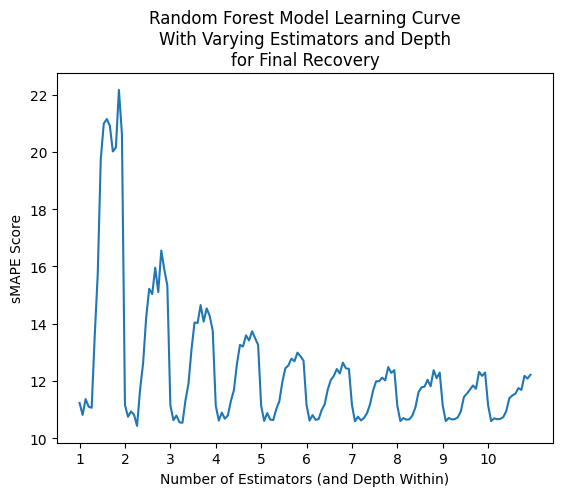

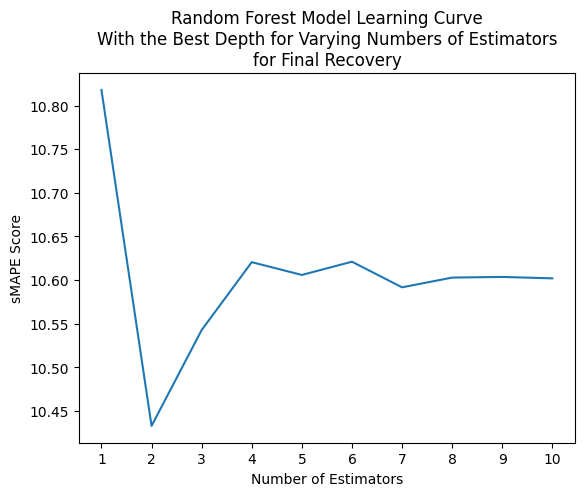

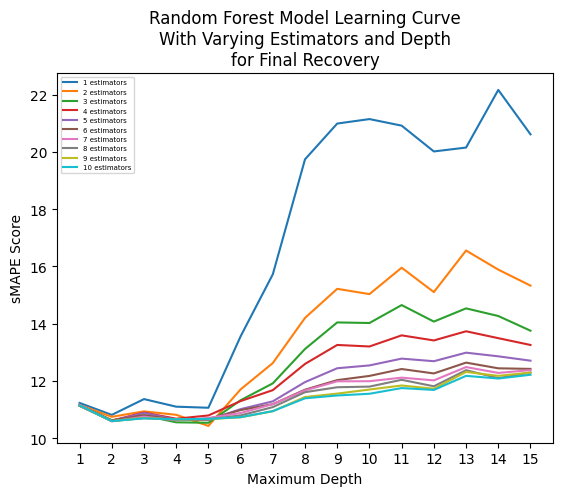

In [42]:
# plot results for random forest regressor models predicting rougher.output.recovery with varying estimators and depths

n_est = len(rf_results['est'].unique())
n_depth = len(rf_results['depth'].unique())
est_by_depth = [x + 1 + y / n_depth for x in range(n_est) for y in range(n_depth)]

plt.plot(est_by_depth, rf_results['result'])
plt.xlabel('Number of Estimators (and Depth Within)')
plt.ylabel('sMAPE Score')
plt.title('Random Forest Model Learning Curve\nWith Varying Estimators and Depth\nfor Final Recovery')
plt.xticks(range(1, n_est+1))

plt.show()
print()

rf_max = pd.DataFrame(rf_results.groupby('est')['result'].min()).reset_index()

plt.plot(rf_max['est'], rf_max['result'])
plt.xlabel('Number of Estimators')
plt.ylabel('sMAPE Score')
plt.title('Random Forest Model Learning Curve\nWith the Best Depth for Varying Numbers of Estimators\nfor Final Recovery')
plt.xticks(range(1, n_est+1))
plt.show()
print()

est_results = {}
for row in range(len(rf_results)):
    est = rf_results.loc[row, 'est']
    val = rf_results.loc[row, 'result']
    est_results.setdefault(est, []).append(val)

for est in est_results.keys():
    plt.plot(range(1, len(est_results[est])+1), est_results[est], label=f"{est} estimators")
plt.xlabel('Maximum Depth')
plt.ylabel('sMAPE Score')
plt.title('Random Forest Model Learning Curve\nWith Varying Estimators and Depth\nfor Final Recovery')
plt.xticks(range(1, n_depth+1))
plt.legend(fontsize=5)
plt.show()

The cross-validated linear regression models predicting final.output.recovery had an average sMAPE of 12.52. 

The best-performing cross-validated decision tree model predicting final.output.recovery had a maximum depth of 2 and an average sMAPE score of 10.69. Model performance exceeded the linear regression model at a maximum depth of 1 (sMAPE = 11.33). A noticeable drop in performance for maximum depths greater than 2 suggests that further improvement is unlikely. 

The best-performing cross-validated random forest model predicting final.output.recovery had 2 estimators, a maximum depth of 5, and an average sMAPE score of 10.43. Model performance exceeded the best decision tree regressor at that point and steadily declined thereafter, suggesting that further improvement is unlikely.

In [43]:
# Check that the date column is a suitable key for extracting targets from the df_full dataset

df_full['date'].duplicated(keep=False).sum()

0

In [44]:
# Test the linear regression models against the features in df_test and targets in df_full

test_features = list(df_test.columns)[1:]
features_test = df_test[test_features]
features_train = df_train[test_features]
target_train_rougher = df_train['rougher.output.recovery']
target_train_final = df_train['final.output.recovery']

df_test_with_targets = df_test[['date']].merge(df_full[['date', 'rougher.output.recovery', 'final.output.recovery']], on='date', how='left')
target_test_rougher = df_test_with_targets['rougher.output.recovery']
target_test_final = df_test_with_targets['final.output.recovery']

model_rougher = LinearRegression()
model_final = LinearRegression()

model_rougher.fit(features_train, target_train_rougher)
model_final.fit(features_train, target_train_final)

predictions_rougher = pd.Series(model_rougher.predict(features_test))
predictions_final = pd.Series(model_final.predict(features_test))

print('Linear Regression Models')
print('sMAPE for rougher recovery:', sMAPE(target_test_rougher, predictions_rougher))
print('sMAPE for final recovery:', sMAPE(target_test_final, predictions_final))
print('Final sMAPE:', final_sMAPE(target_test_rougher, predictions_rougher, target_test_final, predictions_final))

Linear Regression Models
sMAPE for rougher recovery: 11.939639505642795
sMAPE for final recovery: 11.52389423256091
Final sMAPE: 11.627830550831382


In [45]:
# Test the decision tree regressor models against the features in df_test and targets in df_full

test_features = list(df_test.columns)[1:]
features_test = df_test[test_features]
features_train = df_train[test_features]
target_train_rougher = df_train['rougher.output.recovery']
target_train_final = df_train['final.output.recovery']

df_test_with_targets = df_test[['date']].merge(df_full[['date', 'rougher.output.recovery', 'final.output.recovery']], on='date', how='left')
target_test_rougher = df_test_with_targets['rougher.output.recovery']
target_test_final = df_test_with_targets['final.output.recovery']

model_rougher = DecisionTreeRegressor(random_state=12345, max_depth=2)
model_final = DecisionTreeRegressor(random_state=12345, max_depth=2)

model_rougher.fit(features_train, target_train_rougher)
model_final.fit(features_train, target_train_final)

predictions_rougher = pd.Series(model_rougher.predict(features_test))
predictions_final = pd.Series(model_final.predict(features_test))

print('Decision Tree Models')
print('sMAPE for rougher recovery:', sMAPE(target_test_rougher, predictions_rougher))
print('sMAPE for final recovery:', sMAPE(target_test_final, predictions_final))
print('Final sMAPE:', final_sMAPE(target_test_rougher, predictions_rougher, target_test_final, predictions_final))

Decision Tree Models
sMAPE for rougher recovery: 11.038875754254557
sMAPE for final recovery: 11.55843680455119
Final sMAPE: 11.428546541977031


In [46]:
# Test the random forest regressor models against the features in df_test and targets in df_full

test_features = list(df_test.columns)[1:]
features_test = df_test[test_features]
features_train = df_train[test_features]
target_train_rougher = df_train['rougher.output.recovery']
target_train_final = df_train['final.output.recovery']

df_test_with_targets = df_test[['date']].merge(df_full[['date', 'rougher.output.recovery', 'final.output.recovery']], on='date', how='left')
target_test_rougher = df_test_with_targets['rougher.output.recovery']
target_test_final = df_test_with_targets['final.output.recovery']

model_rougher = RandomForestRegressor(random_state=12345, n_estimators=4, max_depth=6)
model_final = RandomForestRegressor(random_state=12345, n_estimators=2, max_depth=5)

model_rougher.fit(features_train, target_train_rougher)
model_final.fit(features_train, target_train_final)

predictions_rougher = pd.Series(model_rougher.predict(features_test))
predictions_final = pd.Series(model_final.predict(features_test))

print('Random Forest Models')
print('sMAPE for rougher recovery:', sMAPE(target_test_rougher, predictions_rougher))
print('sMAPE for final recovery:', sMAPE(target_test_final, predictions_final))
print('Final sMAPE:', final_sMAPE(target_test_rougher, predictions_rougher, target_test_final, predictions_final))

Random Forest Models
sMAPE for rougher recovery: 11.949439708171534
sMAPE for final recovery: 12.22002956243413
Final sMAPE: 12.15238209886848


In [47]:
# Sanity check the models by comparing them to a constant model of target means

target_test_rougher = df_test_with_targets['rougher.output.recovery']
target_test_final = df_test_with_targets['final.output.recovery']

predictions_rougher = pd.Series(target_test_rougher.mean(), index=target_test_rougher.index)
predictions_final = pd.Series(target_test_final.mean(), index=target_test_final.index)

print('Sanity Check Mean Models')
print('sMAPE for rougher recovery:', sMAPE(target_test_rougher, predictions_rougher))
print('sMAPE for final recovery:', sMAPE(target_test_final, predictions_final))
print('Final sMAPE:', final_sMAPE(target_test_rougher, predictions_rougher, target_test_final, predictions_final))

Sanity Check Mean Models
sMAPE for rougher recovery: 9.948726994290137
sMAPE for final recovery: 13.087915455670151
Final sMAPE: 12.303118340325149


The test dataset contains no targets, so they were taken from the full dataset. By matching observations based on the date column (unique for each observation), features from df_test were lined up with the target observations from df_full. 

Evaluated on the test data by Final sMAPE (a combination of the two target scores) the decision tree regressor was the best (11.43), followed by the linear regression model (11.63), and finally the random forest regressor model (12.15). The random forest regressor models scored best for both targets during training but worst for both targets and the final combined score during testing. My final pick is the decision tree regressor model. 

As a sanity check, I calculated sMAPE using only the target means as predictions. That constant model performed worse than any of the others on Final sMAPE (12.30) as expected. 

# General Discussion #

For this project, I modeled the gold ore extraction process to predict the abundance of gold in the final concentrate and rougher residues. I imported and prepared the data, addressed missing and extreme values, verified recovery calculations, observed metal concentration levels at different purification stages, compared feed particle size distributions across datasets, trained regression models, and evaluated them using symmetric mean absolute percentage error (sMAPE).

I verified the rougher concentrate recovery data in the training dataset by recalculating them with a formula. It introduced undefined values due to division by zero in 13.7% of rows, which I dropped for the purposes of verification because I had no basis on which to fill them with other values. The calculated and given values for rougher recovery were effectively identical, confirming the data's validity.

The data were voluminous, occupying up to 87 columns across three datasets with diverse distributions. Some columns were roughly normal but many were skewed, discontinuous, or replete with excess zeros. Data were missing in nearly every column and a substantial minority of rows (35% in the training dataset). The missing values appeared to be randomly distributed and too spread out to be dropped, so I filled them using a forward-filling method.

Rougher feed particle size was similar in training (mean = 60.19, standard deviation = 30.52) and testing (mean = 55.90, standard deviation = 22.71) datasets and final feed particle size was almost identical (training mean = 7.30, standard deviation = 0.62; testing mean = 7.26, standard deviation = 0.61). In both cases, the mean difference between datasets was statistically significant (p < 0.05). I determined that the datasets were similar enough for modeling but standardized all features to be sure.

Examining the concentrations of certain metals (silver, lead, and gold) at various purification stages in the training dataset, it was apparent that the process worked as expected. Gold concentrations steadily and substantially increased (from 7.14 to 39.32) while lead increased much less (3.19 to 9.08) and silver ultimately decreased (7.80 to 4.70).

Exploring the total concentration of all substances at relevant purification stages revealed a large number of very low values, predominantly zeros, representing 9.4% - 11.8% of the data per stage. The observations with excess zeros were mostly the same ones that created divide-by-zero issues during recovery data verification. They appear to be invalid for some reason; data was likely lost or misrecorded. Imputing thousands of excess zeros in dozens of columns seemed impractical without threatening model integrity. I decided the safest solution was to simply drop the problematic observations for modeling, as I had earlier for verification. It was a substantial loss of 15% of the dataset, but not enough to undermine model validity for the remaining 14,287 observations.

The models for this project were ultimately tested on the testing dataset but it lacked all output and calculation features, representing 39% of the training dataset. I dropped the extra features from the training dataset so the models would be amenable to testing. The testing dataset also lacked the targets (rougher.output.recovery and final.output.recovery), so I extracted them from the full dataset by matching observations on the date feature, which served as a unique key across datasets. All models were cross-validated to ensure reliability.

Linear regression models produced an average sMAPE score of 13.96 when predicting rougher recovery and 12.52 when predicting final recovery in the training dataset. The best decision tree regressor models had a maximum depth of 2 when predicting rougher recovery (average sMAPE = 12.53) and final recovery (average sMAPE = 10.69). The best random forest regressor models had 4 estimators and a maximum depth of 6 when predicting rougher recovery (average sMAPE = 11.75) and 2 estimators and a maximum depth of 5 when predicting final recovery (average sMAPE = 10.43). Declining performance with increased complexity suggested that those were likely the best decision tree and random forest regressor models available.

Final evaluation with sMAPE on the test dataset (with targets from the full dataset) revealed remarkable consistency across models. Despite random forest regressor models better predicting both rougher and final recovery during training, they were the worst for both targets during testing. The Final sMAPE score combines rougher and final recovery scores, providing an overall evaluation. Based on Final sMAPE, the decision tree regressor model was slightly better (11.43) than the linear regression model (11.63) and the random forest regressor model (12.15). My final pick was the decision tree regressor model.